In [1]:
from once_for_all.evaluation.perf_dataset import PerformanceDataset
from utils.config_utils import get_mfcc_params, get_mel_spectrogram_params, get_spectrogram_params
import pandas as pd
import numpy as np

import json
import os

import seaborn as sns
import matplotlib.pyplot as plt

### Auxiliary functions for loading + arranging collected data

In [2]:
def create_stats_df(data):
    # Gather initial rows
    df = None
    for k, v in data.items():
        if df is None: # init
            df = pd.json_normalize(v)
            df = pd.concat([pd.json_normalize(json.loads(k)), df], axis=1)
        else: # build df
            row = pd.json_normalize(v)
            row = pd.concat([pd.json_normalize(json.loads(k)), row], axis=1)
            df = df.append(row)
        
    try: # Drop unused latency measurements
        df['gpu4lat']= df['net_info.gpu4 latency.hist.sample'].apply(lambda x: x[0][0]/x[0][1])
        df['cpulat']= df['net_info.cpu latency.hist.sample'].apply(lambda x: x[0][0]/x[0][1])
    
        df = df.drop(columns=['net_info.gpu4 latency.val', 'net_info.gpu4 latency.hist.warmup',
                          'net_info.gpu4 latency.hist.sample',
                          'net_info.cpu latency.val', 'net_info.cpu latency.hist.warmup',
                          'net_info.cpu latency.hist.sample'])
    except: # if latency is not measured during evaluation, set to -1
        df['gpu4lat']= -1
        df['cpulat']= -1
    
    try: # renaming
        df["memory"] = df["net_info.MACs"] 
        df = df.drop(columns=['net_info.MACs'])
    except: # if memory is not measured during evaluation, set to -1
        df["memory"] = -1
        
    return df

def name_ft_extr(fttype, paramid, params):
    return fttype + str(paramid) + "_" + str(tuple(params))

def extract_pi(params, i):
    return params[i]

def get_mfcc_bins(ft_extr_type, params_id):
    if ft_extr_type == "mfcc":
        if params_id == 7:
            return 80
        elif params_id < 5 or params_id == 9: # 1, 2, 3, 4
            return 10
        else: # 5, 6, 8
            return 40
    else:
        return 0

### Select feature extraction types to evaluate + params_ids if multiple runs are made

In [3]:
ft_extr_types = ["raw","spectrogram", "log_spectrogram", "mel_spectrogram", "log_mel_spectrogram", "mfcc"]
params_ids = [1,2,3,4,5,6,7,8,9]


df = None
full_ft_extr_params_list = None

#### Build the dataframe containing all collected data for the selected parameters

In [5]:
for f_i, ft_extr_type in enumerate(ft_extr_types):
    for p_i, params_id in enumerate(params_ids):
        ft_extr_params_list = None
        try:
            if ft_extr_type == "mfcc":
                n_mfcc_bins, ft_extr_params_list = get_mfcc_params(params_id)
            elif ft_extr_type == "mel_spectrogram" or ft_extr_type == "log_mel_spectrogram":
                ft_extr_params_list = get_mel_spectrogram_params(params_id)
            elif ft_extr_type == "raw":
                if params_id == 1: 
                    ft_extr_params_list = [(125, 128)]
                else:
                    continue # skip params id
            elif ft_extr_type == "spectrogram" or ft_extr_type == "log_spectrogram":
                ft_extr_params_list = get_spectrogram_params(params_id)
            elif ft_extr_type == "linear_stft":
                ft_extr_params_list = get_linear_stft_params(params_id)
        except:
            continue # skip params id
            
        
        path = "eval/" + ft_extr_type + str(params_id) + "/"
        if os.path.isdir(path):
            performance_dataset = PerformanceDataset(path, use_csv=False)
            for ft_extr_params in ft_extr_params_list:
                if os.path.isfile(path + "src/" + str(list(ft_extr_params)) + ".dict"):
                    # Debugging purposes, check everything is indeed loaded or skipped accordingly
                    print("in : ", path + "src/" + str(list(ft_extr_params)) + ".dict")
                    data = performance_dataset.load_dataset(ft_extr_params)
                    df_ft_extr_p = create_stats_df(data)
                    df_ft_extr_p.loc[:, 'params_id'] = params_id
                    df_ft_extr_p.loc[:, 'ft_extr_type'] = ft_extr_type
                    if df is None:
                        df = df_ft_extr_p
                    else:
                        df = pd.concat([df, df_ft_extr_p], axis=0)
                else:
                    print("not in : ", path + "src/" + str(list(ft_extr_params)) + ".dict") # Debug

            
            for i, ft_e_p in enumerate(ft_extr_params_list):
                if full_ft_extr_params_list is None:
                    full_ft_extr_params_list = [list(ft_e_p)]   
                else:     
                    if ft_e_p not in full_ft_extr_params_list:
                        full_ft_extr_params_list.append(list(ft_e_p))
                        
                        
print("full ft extr params list : ", full_ft_extr_params_list) # Lists all feature extraction parameters used in total

# Convert ft_extr_params to id for plotting
df = df.loc[:,~df.columns.duplicated()] # Remove duplicates
df["ft_extr_id"] = df["ft_extr_params"].apply(lambda x: full_ft_extr_params_list.index(x))    
df['ft_extr'] = df.apply(lambda x: name_ft_extr(x.ft_extr_type, x.params_id, x.ft_extr_params), axis=1) # full feature extraction name
df['ft_extr_p0'] = df.apply(lambda x: extract_pi(x.ft_extr_params,0), axis=1) # first ft_extr params
df['ft_extr_p1'] = df.apply(lambda x: extract_pi(x.ft_extr_params,1), axis=1) # second ft_extr params
df['mfcc_bins'] = df.apply(lambda x: get_mfcc_bins(x.ft_extr_type, x.params_id), axis=1) # only for mfcc
df['net_info.flops'] = df['net_info.flops'] / 1e6 # convert to MOps
df['net_info.params'] = df['net_info.params'] / 1e3 # to K

def name_mfcc(mfcc_bins, mels, win_len):
    return str(mfcc_bins) + " bins, " + str(mels) + " mels, " + str(win_len) + " winlen"

df["mfcc_id"] = df.apply(lambda x: name_mfcc(x.mfcc_bins, x.ft_extr_p0, x.ft_extr_p1), axis=1)

df

in :  eval/raw1_v2/src/[125, 128].dict
in :  eval/mel_spectrogram3_v2/src/[80, 20].dict
in :  eval/mel_spectrogram3_v2/src/[80, 30].dict
in :  eval/mel_spectrogram3_v2/src/[80, 40].dict
in :  eval/mfcc1_v2/src/[40, 40].dict
in :  eval/mfcc3_v2/src/[40, 30].dict
in :  eval/mfcc3_v2/src/[40, 40].dict
in :  eval/mfcc3_v2/src/[40, 50].dict
in :  eval/mfcc5_v2/src/[40, 30].dict
in :  eval/mfcc5_v2/src/[40, 40].dict
in :  eval/mfcc5_v2/src/[40, 50].dict
in :  eval/mfcc6_v2/src/[80, 30].dict
in :  eval/mfcc6_v2/src/[80, 40].dict
in :  eval/mfcc6_v2/src/[80, 50].dict


,w,ks,d,e,ft_extr_params,ft_extr_params,data_shape,top1,net_info.params,net_info.flops,gpu4lat,cpulat,memory,params_id,ft_extr_type
0,"[0, 0, 0, 0, 0]","[3, 3, 3, 3, 3, 3, 3, 3, 7, 7, 3, 3, 3, 3, 7, 5]","[3, 4, 1, 4]","[1, 3, 3, 1, 2, 3, 3, 2, 1, 1, 2, 1, 3, 2, 1, 3]","[125, 128]","[125, 128]","[1, 125, 128]",78.130672,242572,354738944.0,3.902364,18.673015,-1.0,1,raw
0,"[0, 0, 0, 0, 0]","[3, 3, 3, 3, 3, 3, 5, 7, 3, 3, 3, 3, 5, 7, 5, 3]","[3, 2, 3, 2]","[3, 1, 1, 1, 2, 1, 3, 2, 2, 1, 2, 3, 1, 3, 1, 2]","[125, 128]","[125, 128]","[1, 125, 128]",80.149728,144140,210121472.0,2.797008,14.256215,-1.0,1,raw
0,"[0, 0, 0, 0, 0]","[3, 3, 3, 3, 3, 3, 7, 7, 5, 5, 7, 5, 3, 5, 5, 3]","[2, 3, 1, 1]","[1, 3, 1, 1, 3, 1, 1, 2, 1, 3, 3, 3, 1, 3, 3, 3]","[125, 128]","[125, 128]","[1, 125, 128]",75.975499,84492,202740480.0,2.039528,11.237001,-1.0,1,raw
0,"[0, 0, 0, 0, 0]","[3, 3, 3, 3, 3, 5, 3, 3, 5, 5, 3, 7, 3, 7, 5, 3]","[1, 1, 2, 3]","[1, 2, 2, 2, 2, 3, 3, 3, 1, 1, 3, 2, 1, 1, 3, 1]","[125, 128]","[125, 128]","[1, 125, 128]",75.930127,79564,66994944.0,1.851869,17.899036,-1.0,1,raw
0,"[0, 0, 0, 0, 0]","[3, 3, 3, 3, 3, 5, 3, 5, 3, 5, 3, 7, 7, 5, 3, 5]","[1, 4, 1, 3]","[1, 3, 2, 1, 3, 2, 1, 3, 2, 2, 2, 2, 2, 2, 2, 3]","[125, 128]","[125, 128]","[1, 125, 128]",76.633394,169292,153834240.0,2.751851,13.511658,-1.0,1,raw
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,"[0, 0, 0, 0, 0]","[7, 7, 7, 7, 5, 5, 7, 3, 5, 3, 3, 3, 3, 3, 3, 3]","[2, 1, 4, 2]","[3, 2, 2, 1, 3, 3, 1, 1, 3, 3, 3, 1, 2, 3, 2, 2]","[80, 50]","[80, 50]","[1, 41, 40]",89.723231,225292,34979520.0,-1.000000,-1.000000,12288.0,6,mfcc
0,"[0, 0, 0, 0, 0]","[7, 7, 7, 7, 5, 5, 7, 7, 5, 5, 3, 5, 3, 5, 7, 5]","[2, 4, 2, 1]","[3, 2, 2, 3, 1, 3, 1, 2, 1, 2, 3, 3, 1, 2, 2, 2]","[80, 50]","[80, 50]","[1, 41, 40]",88.407441,158156,31735616.0,-1.000000,-1.000000,12288.0,6,mfcc
0,"[0, 0, 0, 0, 0]","[7, 7, 7, 7, 7, 3, 3, 5, 7, 7, 3, 7, 5, 5, 5, 5]","[3, 3, 4, 4]","[1, 3, 3, 1, 1, 2, 3, 1, 1, 2, 2, 2, 2, 1, 1, 3]","[80, 50]","[80, 50]","[1, 41, 40]",88.430127,266636,40020288.0,-1.000000,-1.000000,12288.0,6,mfcc
0,"[0, 0, 0, 0, 0]","[7, 7, 7, 7, 7, 5, 7, 5, 7, 5, 5, 3, 3, 5, 5, 5]","[3, 3, 2, 1]","[1, 1, 1, 2, 1, 1, 1, 3, 2, 1, 1, 2, 3, 2, 3, 1]","[80, 50]","[80, 50]","[1, 41, 40]",88.384755,101708,13331392.0,-1.000000,-1.000000,12288.0,6,mfcc


In [8]:
df.to_csv("results.csv")

,Unnamed: 0,w,ks,d,e,ft_extr_params,data_shape,top1,net_info.params,net_info.flops,...,cpulat,memory,params_id,ft_extr_type,ft_extr_id,ft_extr,ft_extr_p0,ft_extr_p1,mfcc_bins,mfcc_id
0,0,"[0, 0, 0, 0, 0]","[3, 3, 3, 3, 3, 3, 3, 3, 7, 7, 3, 3, 3, 3, 7, 5]","[3, 4, 1, 4]","[1, 3, 3, 1, 2, 3, 3, 2, 1, 1, 2, 1, 3, 2, 1, 3]","[125, 128]","[1, 125, 128]",78.130672,242.572,354.738944,...,18.673015,-1.0,1,raw,0,"raw1_(125, 128)",125,128,0,"0 bins, 125 mels, 128 winlen"
1,0,"[0, 0, 0, 0, 0]","[3, 3, 3, 3, 3, 3, 5, 7, 3, 3, 3, 3, 5, 7, 5, 3]","[3, 2, 3, 2]","[3, 1, 1, 1, 2, 1, 3, 2, 2, 1, 2, 3, 1, 3, 1, 2]","[125, 128]","[1, 125, 128]",80.149728,144.140,210.121472,...,14.256215,-1.0,1,raw,0,"raw1_(125, 128)",125,128,0,"0 bins, 125 mels, 128 winlen"
2,0,"[0, 0, 0, 0, 0]","[3, 3, 3, 3, 3, 3, 7, 7, 5, 5, 7, 5, 3, 5, 5, 3]","[2, 3, 1, 1]","[1, 3, 1, 1, 3, 1, 1, 2, 1, 3, 3, 3, 1, 3, 3, 3]","[125, 128]","[1, 125, 128]",75.975499,84.492,202.740480,...,11.237001,-1.0,1,raw,0,"raw1_(125, 128)",125,128,0,"0 bins, 125 mels, 128 winlen"
3,0,"[0, 0, 0, 0, 0]","[3, 3, 3, 3, 3, 5, 3, 3, 5, 5, 3, 7, 3, 7, 5, 3]","[1, 1, 2, 3]","[1, 2, 2, 2, 2, 3, 3, 3, 1, 1, 3, 2, 1, 1, 3, 1]","[125, 128]","[1, 125, 128]",75.930127,79.564,66.994944,...,17.899036,-1.0,1,raw,0,"raw1_(125, 128)",125,128,0,"0 bins, 125 mels, 128 winlen"
4,0,"[0, 0, 0, 0, 0]","[3, 3, 3, 3, 3, 5, 3, 5, 3, 5, 3, 7, 7, 5, 3, 5]","[1, 4, 1, 3]","[1, 3, 2, 1, 3, 2, 1, 3, 2, 2, 2, 2, 2, 2, 2, 3]","[125, 128]","[1, 125, 128]",76.633394,169.292,153.834240,...,13.511658,-1.0,1,raw,0,"raw1_(125, 128)",125,128,0,"0 bins, 125 mels, 128 winlen"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
218558,0,"[0, 0, 0, 0, 0]","[7, 7, 7, 7, 5, 5, 7, 7, 3, 5, 3, 3, 5, 5, 5, 3]","[1, 4, 3, 3]","[2, 1, 3, 3, 3, 3, 3, 3, 1, 3, 1, 2, 1, 2, 2, 3]","[40, 40]","[1, 51, 10]",85.299456,241.996,9.727872,...,-1.000000,1609728.0,9,mfcc,6,"mfcc9_(40, 40)",40,40,10,"10 bins, 40 mels, 40 winlen"
218559,0,"[0, 0, 0, 0, 0]","[7, 7, 7, 7, 5, 5, 7, 7, 5, 5, 3, 5, 3, 5, 7, 5]","[2, 4, 2, 1]","[3, 2, 2, 3, 1, 3, 1, 2, 1, 2, 3, 3, 1, 2, 2, 2]","[40, 40]","[1, 51, 10]",86.161525,158.156,10.270016,...,-1.000000,1609728.0,9,mfcc,6,"mfcc9_(40, 40)",40,40,10,"10 bins, 40 mels, 40 winlen"
218560,0,"[0, 0, 0, 0, 0]","[7, 7, 7, 7, 5, 7, 5, 3, 3, 5, 3, 5, 5, 7, 7, 5]","[1, 4, 4, 2]","[3, 1, 1, 3, 1, 2, 2, 2, 3, 3, 1, 3, 2, 2, 2, 1]","[40, 40]","[1, 51, 10]",86.070781,240.588,8.786368,...,-1.000000,1609728.0,9,mfcc,6,"mfcc9_(40, 40)",40,40,10,"10 bins, 40 mels, 40 winlen"
218561,0,"[0, 0, 0, 0, 0]","[7, 7, 7, 7, 5, 7, 7, 7, 5, 3, 5, 5, 7, 5, 3, 7]","[1, 2, 3, 3]","[3, 3, 3, 2, 1, 3, 3, 1, 1, 2, 3, 2, 1, 1, 1, 1]","[40, 40]","[1, 51, 10]",84.641561,150.348,6.773120,...,-1.000000,1609728.0,9,mfcc,6,"mfcc9_(40, 40)",40,40,10,"10 bins, 40 mels, 40 winlen"


# Plotting

### Auxiliary functions, set height+aspect

In [2]:
height = 6
aspect = 6/6

def remove_worse(_df, x, y, col, base):
    df = _df.copy()
    x_col = "rnd_" + x
    df[x_col] = df[x].apply(lambda val: round_to_base(num=val, base=base)) # build col with rounded val
    
    max_df = df.groupby([x_col,col]).max().reset_index() # For all same rounded x values, remove non max y
    return max_df

def get_mean_df(_df, x, y, col, base):
    df = _df.copy()
    x_col = "rnd_" + x
    df[x_col] = df[x].apply(lambda val: round_to_base(num=val, base=base)) # build col with rounded val
    mean_df = df.groupby([x_col,col]).mean().reset_index() # For all same rounded x values, remove non max y
    return mean_df

def plot_distribution(y, hue, data):   
    dis = sns.displot(x=y, hue=hue, col=col, data=data, kind="kde",palette="bright", height=height, aspect=aspect)
    fig = dis.fig 
    fig.suptitle("%s distribution, by %s" % (y, hue), fontsize=12)
    
def plot_top(x, y, hue, col, df, keep_threshold, base, scatter_kws, line_kws):
    top_df = remove_worse(df, x, y, hue, base)
    if keep_threshold is not None:
        top_df = top_df[top_df[x] < keep_threshold]
                
    lm = sns.lmplot(x=x, y=y, hue=hue, col=col, data=top_df, palette="colorblind",
                    scatter=True, fit_reg=False, order=2,
                    height=height, aspect=aspect, scatter_kws=scatter_kws, line_kws=line_kws)
    f = lm.fig
    f.suptitle("%s to %s, by %s" % (x, y, hue), fontsize=12)
    
def round_to_base(num, base):
    return base * round(num / base)


# "Fancy plotting" - 
def plot_acc(df, x, y, hue, save_name,lab_title, lsize, lalpha, psize, palpha):
    fig=plt.figure(figsize=(10,10))
    plt.style.use('seaborn-dark-palette')
    
    """Set clean label names"""
    y_label = "Accuracy (%)"
    if x == "net_info.params":
        x_label = "Storage (KB)"
    elif x == "net_info.flops":
        x_label = "FLOPs (MOps)"

    df2 = df.copy()
    df2["net_info.params"] = df2["net_info.params"] * 2 # change to account for 16bit/integer

    
    """
    The following code groups the results in order to only display evaluation runs located at the boundary.
    It is used to plot the "best cases" lines using df_new and df_new_cut
    to display measured and asymptotic conditions separately.
    """
    def max_rol(s): # s is `Series`
        newColumn = [0]
        for i, val in enumerate(s):
            newColumn.append(max(val,newColumn[i]))
        return newColumn[1:]

    df2 = df2.sort_values(x)

    unique_hue = list(df2[hue].unique())
    
    df_new = None
    df_new_cut = None
    i = 0
    for h in sorted(unique_hue):
        df_p = df2[df2[hue] == h]
        df_p = df_p.sort_values(x)
        df_p['maxtop1'] = df_p[['top1']].apply(max_rol)
        df_p = df_p.reset_index()
        
        index = df_p[df_p['top1'] == df_p['top1'].max()].index.values[0]
        
        i += 1
        if df_new is None:
            df_new = df_p.sort_values(y, ascending=False).drop_duplicates(x).sort_index()
            df_new_cut = df_p[:index+1].sort_values(y, ascending=False).drop_duplicates(x).sort_index()
            
        else:
            df_new = pd.concat([df_new, df_p.sort_values(y, ascending=False).drop_duplicates(x).sort_index()], axis=0)
            df_new_cut = pd.concat([df_new_cut, df_p[:index+1].sort_values(y, ascending=False).drop_duplicates(x).sort_index()], axis=0)
    
    """Plot"""

    sp = sns.scatterplot(x=x, y=y, hue=hue, data=df2, s=psize, alpha=palpha, palette="deep")

    sns.lineplot(x=x, y="maxtop1", hue=hue, data=df_new, legend=False, linestyle='--', linewidth=lsize, alpha=lalpha, palette="deep")
    sns.lineplot(x=x, y="maxtop1", hue=hue, data=df_new_cut, legend=False, linewidth=lsize, alpha=lalpha, palette="deep")

    """Change label sizes here"""
    sp.set_ylabel(y_label,fontsize=25)
    sp.set_xlabel(x_label,fontsize=25)
    sp.tick_params(labelsize=20)
    # Place legend
    lgnd = plt.legend(loc="lower right", borderaxespad=2, fontsize=18, title=lab_title, title_fontsize=20)
    for lg in lgnd.legendHandles:
        lg._sizes = [100]
    # Plot legend
    plt.savefig(save_name)
    plt.show()

### Load data

In [4]:
df = pd.read_csv("results.csv")
df

,Unnamed: 0,w,ks,d,e,ft_extr_params,data_shape,top1,net_info.params,net_info.flops,...,cpulat,memory,params_id,ft_extr_type,ft_extr_id,ft_extr,ft_extr_p0,ft_extr_p1,mfcc_bins,mfcc_id
0,0,"[0, 0, 0, 0, 0]","[3, 3, 3, 3, 3, 3, 3, 3, 7, 7, 3, 3, 3, 3, 7, 5]","[3, 4, 1, 4]","[1, 3, 3, 1, 2, 3, 3, 2, 1, 1, 2, 1, 3, 2, 1, 3]","[125, 128]","[1, 125, 128]",78.130672,242.572,354.738944,...,18.673015,-1.0,1,raw,0,"raw1_(125, 128)",125,128,0,"0 bins, 125 mels, 128 winlen"
1,0,"[0, 0, 0, 0, 0]","[3, 3, 3, 3, 3, 3, 5, 7, 3, 3, 3, 3, 5, 7, 5, 3]","[3, 2, 3, 2]","[3, 1, 1, 1, 2, 1, 3, 2, 2, 1, 2, 3, 1, 3, 1, 2]","[125, 128]","[1, 125, 128]",80.149728,144.140,210.121472,...,14.256215,-1.0,1,raw,0,"raw1_(125, 128)",125,128,0,"0 bins, 125 mels, 128 winlen"
2,0,"[0, 0, 0, 0, 0]","[3, 3, 3, 3, 3, 3, 7, 7, 5, 5, 7, 5, 3, 5, 5, 3]","[2, 3, 1, 1]","[1, 3, 1, 1, 3, 1, 1, 2, 1, 3, 3, 3, 1, 3, 3, 3]","[125, 128]","[1, 125, 128]",75.975499,84.492,202.740480,...,11.237001,-1.0,1,raw,0,"raw1_(125, 128)",125,128,0,"0 bins, 125 mels, 128 winlen"
3,0,"[0, 0, 0, 0, 0]","[3, 3, 3, 3, 3, 5, 3, 3, 5, 5, 3, 7, 3, 7, 5, 3]","[1, 1, 2, 3]","[1, 2, 2, 2, 2, 3, 3, 3, 1, 1, 3, 2, 1, 1, 3, 1]","[125, 128]","[1, 125, 128]",75.930127,79.564,66.994944,...,17.899036,-1.0,1,raw,0,"raw1_(125, 128)",125,128,0,"0 bins, 125 mels, 128 winlen"
4,0,"[0, 0, 0, 0, 0]","[3, 3, 3, 3, 3, 5, 3, 5, 3, 5, 3, 7, 7, 5, 3, 5]","[1, 4, 1, 3]","[1, 3, 2, 1, 3, 2, 1, 3, 2, 2, 2, 2, 2, 2, 2, 3]","[125, 128]","[1, 125, 128]",76.633394,169.292,153.834240,...,13.511658,-1.0,1,raw,0,"raw1_(125, 128)",125,128,0,"0 bins, 125 mels, 128 winlen"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
218558,0,"[0, 0, 0, 0, 0]","[7, 7, 7, 7, 5, 5, 7, 7, 3, 5, 3, 3, 5, 5, 5, 3]","[1, 4, 3, 3]","[2, 1, 3, 3, 3, 3, 3, 3, 1, 3, 1, 2, 1, 2, 2, 3]","[40, 40]","[1, 51, 10]",85.299456,241.996,9.727872,...,-1.000000,1609728.0,9,mfcc,6,"mfcc9_(40, 40)",40,40,10,"10 bins, 40 mels, 40 winlen"
218559,0,"[0, 0, 0, 0, 0]","[7, 7, 7, 7, 5, 5, 7, 7, 5, 5, 3, 5, 3, 5, 7, 5]","[2, 4, 2, 1]","[3, 2, 2, 3, 1, 3, 1, 2, 1, 2, 3, 3, 1, 2, 2, 2]","[40, 40]","[1, 51, 10]",86.161525,158.156,10.270016,...,-1.000000,1609728.0,9,mfcc,6,"mfcc9_(40, 40)",40,40,10,"10 bins, 40 mels, 40 winlen"
218560,0,"[0, 0, 0, 0, 0]","[7, 7, 7, 7, 5, 7, 5, 3, 3, 5, 3, 5, 5, 7, 7, 5]","[1, 4, 4, 2]","[3, 1, 1, 3, 1, 2, 2, 2, 3, 3, 1, 3, 2, 2, 2, 1]","[40, 40]","[1, 51, 10]",86.070781,240.588,8.786368,...,-1.000000,1609728.0,9,mfcc,6,"mfcc9_(40, 40)",40,40,10,"10 bins, 40 mels, 40 winlen"
218561,0,"[0, 0, 0, 0, 0]","[7, 7, 7, 7, 5, 7, 7, 7, 5, 3, 5, 5, 7, 5, 3, 7]","[1, 2, 3, 3]","[3, 3, 3, 2, 1, 3, 3, 1, 1, 2, 3, 2, 1, 1, 1, 1]","[40, 40]","[1, 51, 10]",84.641561,150.348,6.773120,...,-1.000000,1609728.0,9,mfcc,6,"mfcc9_(40, 40)",40,40,10,"10 bins, 40 mels, 40 winlen"


### Set parameters:

##### Data params:
- Hue: "ft_extr_p0", "ft_extr_p1", "ft_extr_type", ...
- x: "net_info.params" for Storage, ...
- y: "top1" for Accuracy, 
- save_name: file name

##### Display params:
- lab_title: title for hue display box
- lsize: line size for boundary line
- lalpha: line transparency for boundary line
- psize: point size for each evaluation run point
- palpha: point transparency for each evaluation point

# Log Spectrogram

#### Log Spectrogram: Acc / Storage (KB) for Hop length

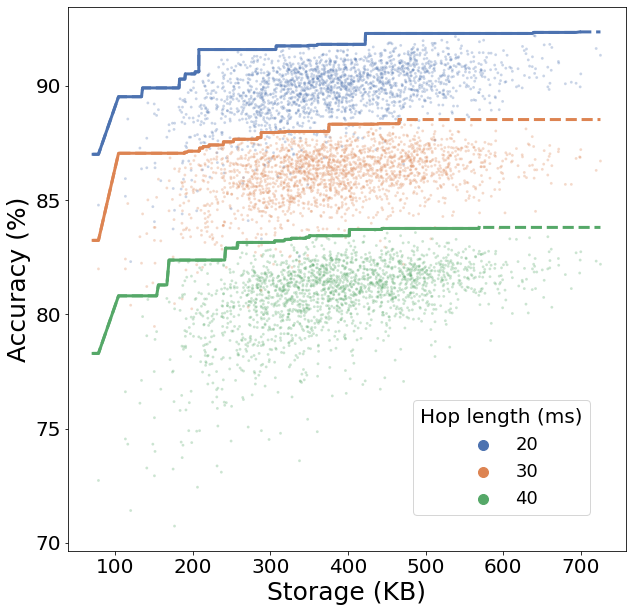

In [10]:
hue = "ft_extr_p1" 
lab_title = "Hop length (ms)"

x = "net_info.params" # for Storage
save_name = "results_imgs/ls_hop_storage" # need to create results_imgs dir


y = "top1"
lsize = 3 
lalpha = 1
psize = 8
palpha = .3


temp_df = df.copy()
temp_df = temp_df[temp_df["ft_extr_type"] == "log_spectrogram"] # filter for ft_extr_type, Log Spectrogram here
plot_acc(temp_df, x, y, hue, save_name, lab_title, lsize, lalpha, psize, palpha)

#### Log Spectrogram: Acc / FLOPs (MOps) for Hop length

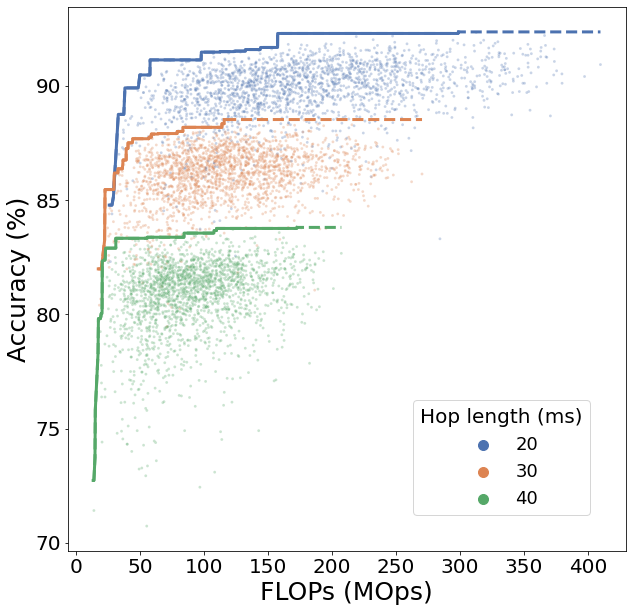

In [11]:
hue = "ft_extr_p1" 
lab_title = "Hop length (ms)"
x = "net_info.flops" 
save_name = "results_imgs/ls_hop_flops"


temp_df = df.copy()
temp_df = temp_df[temp_df["ft_extr_type"] == "log_spectrogram"]
plot_acc(temp_df, x, y, hue, save_name, lab_title, lsize, lalpha, psize, palpha)

# Mel Spectrogram

##### Mel Spectrogram: Acc / Storage (KB) for number of Mel Filterbanks

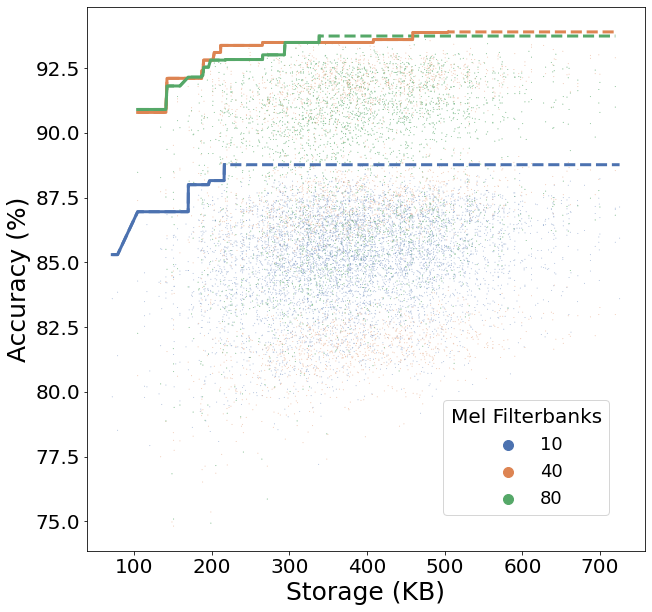

In [8]:
hue = "ft_extr_p0" 
lab_title = "Mel Filterbanks"
x = "net_info.params" 
save_name = "results_imgs/ms_mels_storage"


y = "top1"
lsize = 3
lalpha = 1
psize = 1
palpha = .5


temp_df = df.copy()
temp_df = temp_df[temp_df["ft_extr_type"] == "mel_spectrogram"]
plot_acc(temp_df, x, y, hue, save_name, lab_title, lsize, lalpha, psize, palpha)

#### Mel Spectrogram: Acc / FLOPs (MOps) for number of Mel Filterbanks

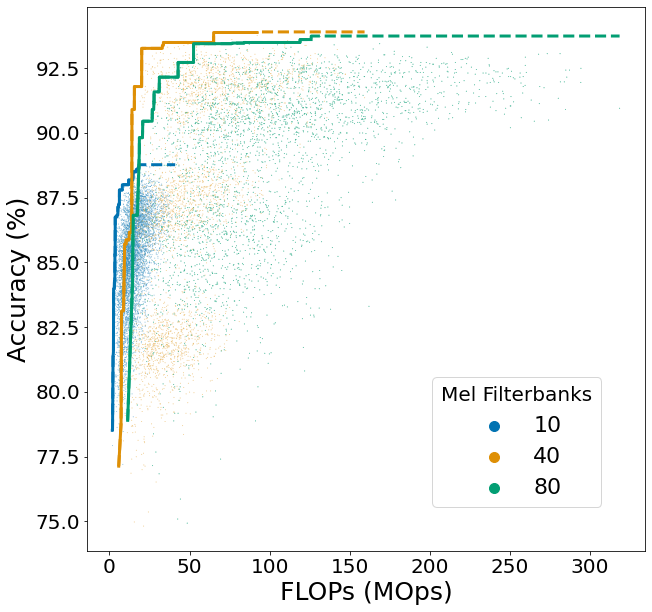

In [65]:
hue = "ft_extr_p0" 
lab_title = "Mel Filterbanks"
x = "net_info.flops" 
save_name = "results_imgs/ms_mels_flops"

y = "top1"
lsize = 3
lalpha = 1
psize = 1
palpha = .5
temp_df = df.copy()
temp_df = temp_df[temp_df["ft_extr_type"] == "mel_spectrogram"]
plot_acc(temp_df, x, y, hue, save_name, lab_title, lsize, lalpha, psize, palpha)

#### Mel Spectrogram: Acc / FLOPs (MOps) for number of Mel Filterbanks, filtered for <=30 MFLOPs

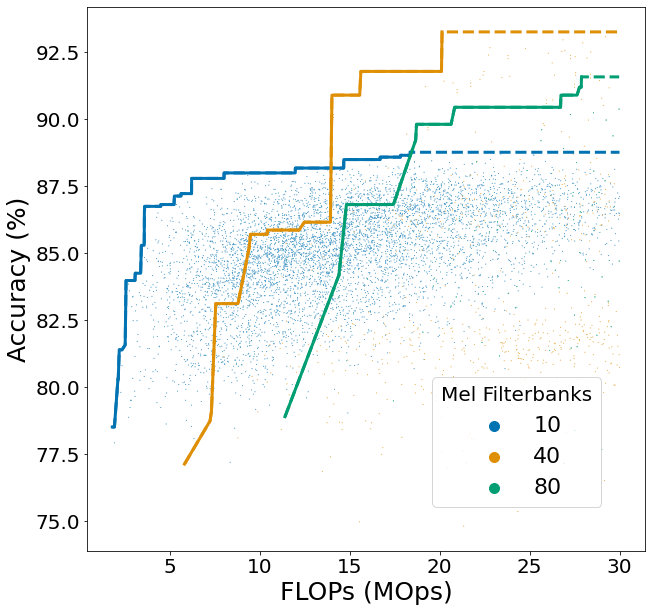

In [126]:
hue = "ft_extr_p0" 
lab_title = "Mel Filterbanks"
x = "net_info.flops" 
save_name = "results_imgs/ms_mels_flops_less30test"

psize = 1

temp_df = df.copy()
temp_df = temp_df[temp_df["ft_extr_type"] == "mel_spectrogram"]

temp_df = temp_df[temp_df["net_info.flops"] <= 30]
plot_acc(temp_df, x, y, hue, save_name, lab_title, lsize, lalpha, psize, palpha)

#### Mel Spectrogram: Acc / FLOPs (MOps) for Window length

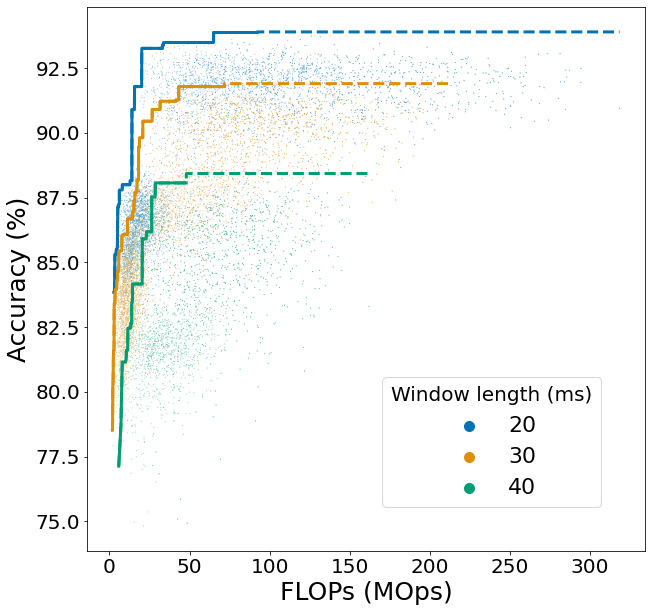

In [67]:
hue = "ft_extr_p1" 
lab_title = "Window length (ms)"
x = "net_info.flops" 
save_name = "results_imgs/ms_win_flops"
y = "top1"
lsize = 3
lalpha = 1
psize = 1
palpha = .5

temp_df = df.copy()
temp_df = temp_df[temp_df["ft_extr_type"] == "mel_spectrogram"]
temp_df = temp_df[temp_df["ft_extr_p1"] != 25] # removed run which had significantly less eval samples thus worse results

plot_acc(temp_df, x, y, hue, save_name, lab_title, lsize, lalpha, psize, palpha)

#### Mel Spectrogram: Acc / Storage for Window length

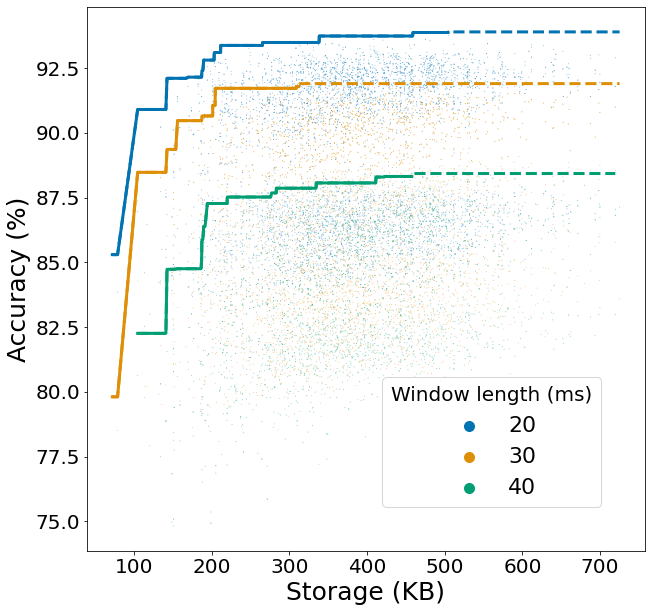

In [68]:
hue = "ft_extr_p1" 
lab_title = "Window length (ms)"
x = "net_info.params" 
save_name = "results_imgs/ms_win_storage"

temp_df = df.copy()
temp_df = temp_df[temp_df["ft_extr_type"] == "mel_spectrogram"]
temp_df = temp_df[temp_df["ft_extr_p1"] != 25]
plot_acc(temp_df, x, y, hue, save_name, lab_title, lsize, lalpha, psize, palpha)

# MFCC

#### MFCC: Acc / FLOPs and Storage for N of MFCC bins

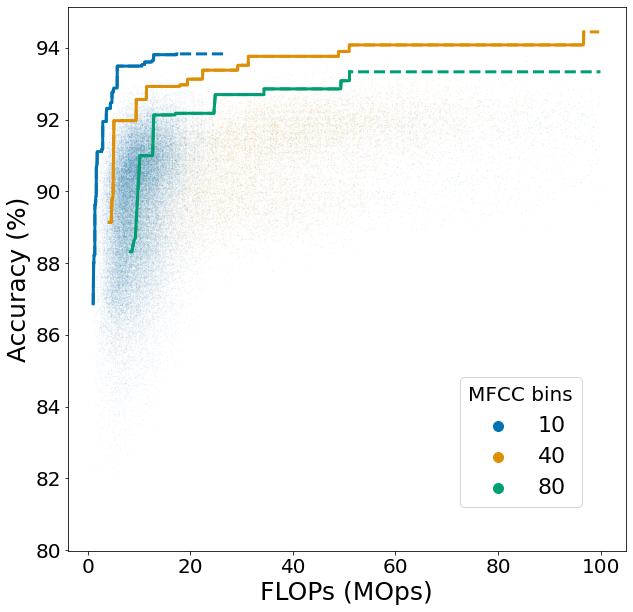

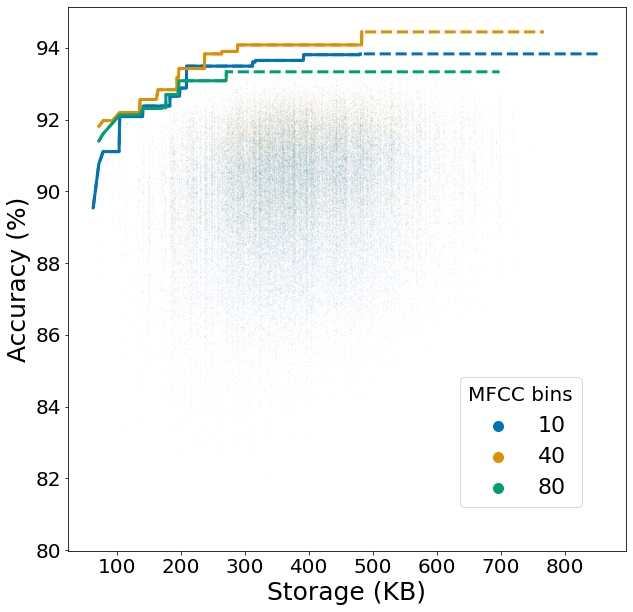

In [115]:
hue = "mfcc_bins" 
lab_title = "MFCC bins"
x = "net_info.flops" 
save_name = "results_imgs/mfcc_bins_flops"
# save_name = "results_imgs/lms_mels_flops_less30"


y = "top1"
lsize = 3
lalpha = 1
psize = 1
palpha = .05

temp_df = df.copy()
temp_df = temp_df[temp_df["ft_extr_type"] == "mfcc"]
temp_df = temp_df[temp_df["net_info.flops"] <= 100]
plot_acc(temp_df, x, y, hue, save_name, lab_title, lsize, lalpha, psize, palpha)


x = "net_info.params" 
save_name = "results_imgs/mfcc_bins_storage"
# save_name = "results_imgs/lms_mels_storage_less30"
plot_acc(temp_df, x, y, hue, save_name, lab_title, lsize, lalpha, psize, palpha)


#### MFCC: Acc / FLOPs and Storage for N of Mel filterbanks (+ zooms)

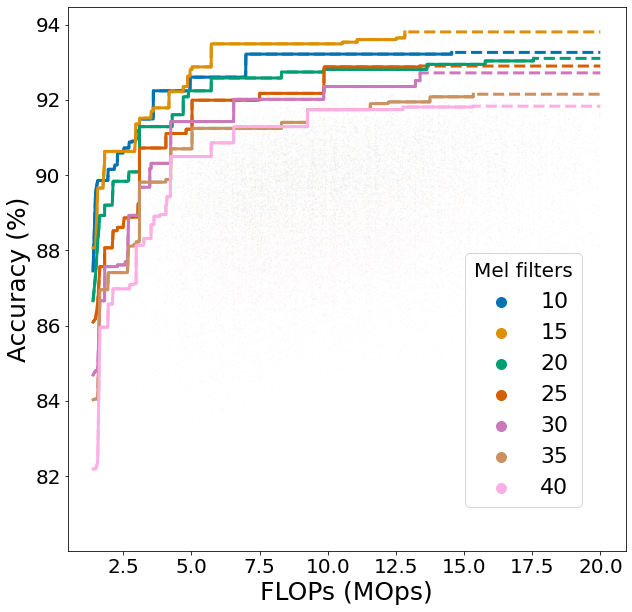

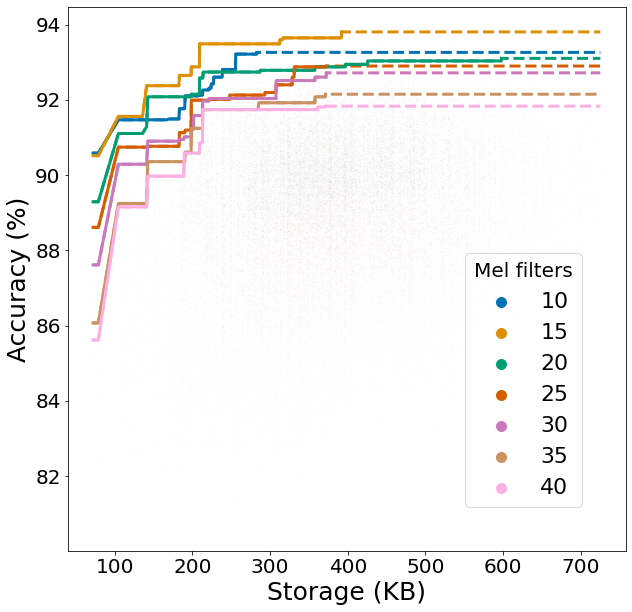

In [116]:
hue = "ft_extr_p0" 
lab_title = "Mel filters"
x = "net_info.flops" 
# save_name = "results_imgs/mfcc_mels_flops"
save_name = "results_imgs/mfcc_mels_flops_less10"


temp_df = df.copy()
temp_df = temp_df[temp_df["params_id"] == 9]

temp_df = temp_df[temp_df["ft_extr_type"] == "mfcc"]
temp_df = temp_df[temp_df["net_info.flops"] <= 20]
plot_acc(temp_df, x, y, hue, save_name, lab_title, lsize, lalpha, psize, palpha)


x = "net_info.params" 
#save_name = "results_imgs/mfcc_mels_storage"
save_name = "results_imgs/mfcc_mels_storage_less10"
plot_acc(temp_df, x, y, hue, save_name, lab_title, lsize, lalpha, psize, palpha)


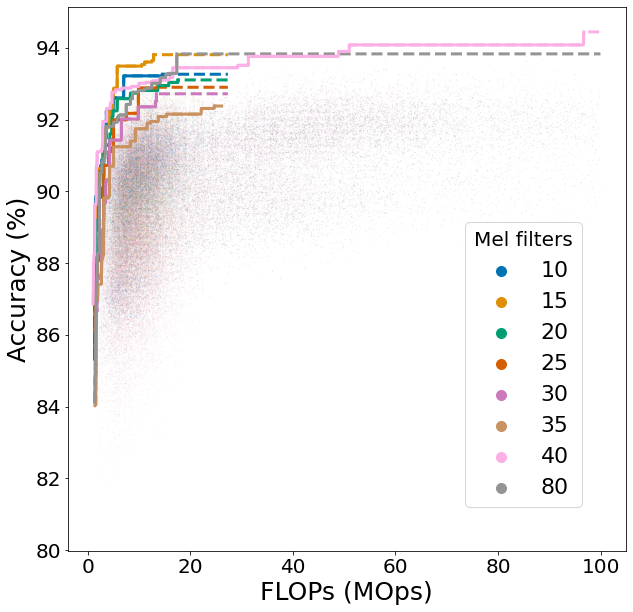

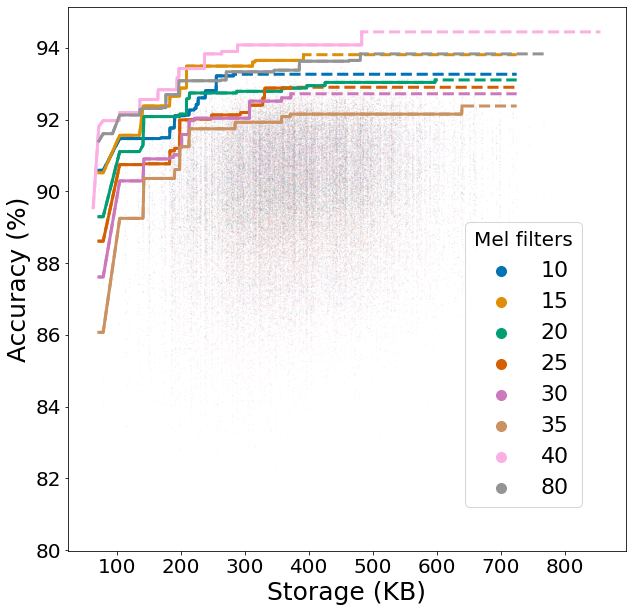

In [119]:
hue = "ft_extr_p0" 
lab_title = "Mel filters"
x = "net_info.flops" 
save_name = "results_imgs/mfcc_mels_flops"
# save_name = "results_imgs/lms_mels_flops_less30"


temp_df = df.copy()
# temp_df = temp_df[temp_df["params_id"] == 9]

temp_df = temp_df[temp_df["ft_extr_type"] == "mfcc"]
temp_df = temp_df[temp_df["net_info.flops"] <= 100]
plot_acc(temp_df, x, y, hue, save_name, lab_title, lsize, lalpha, psize, palpha)


x = "net_info.params" 
save_name = "results_imgs/mfcc_mels_storage"
# save_name = "results_imgs/lms_mels_storage_less30"
plot_acc(temp_df, x, y, hue, save_name, lab_title, lsize, lalpha, psize, palpha)


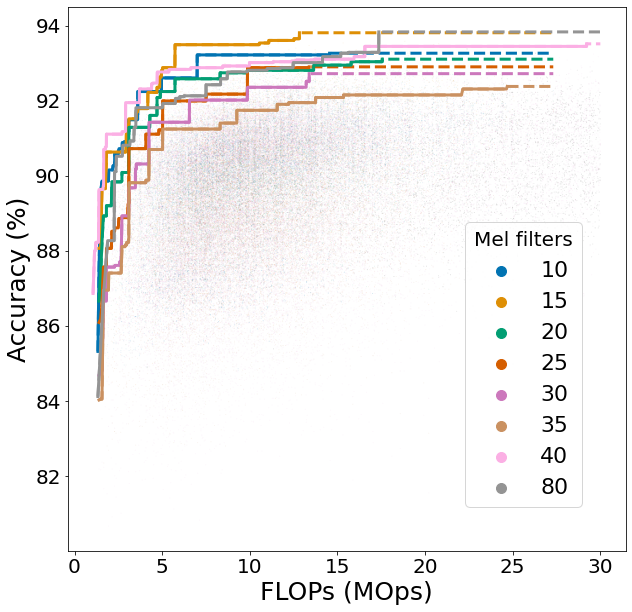

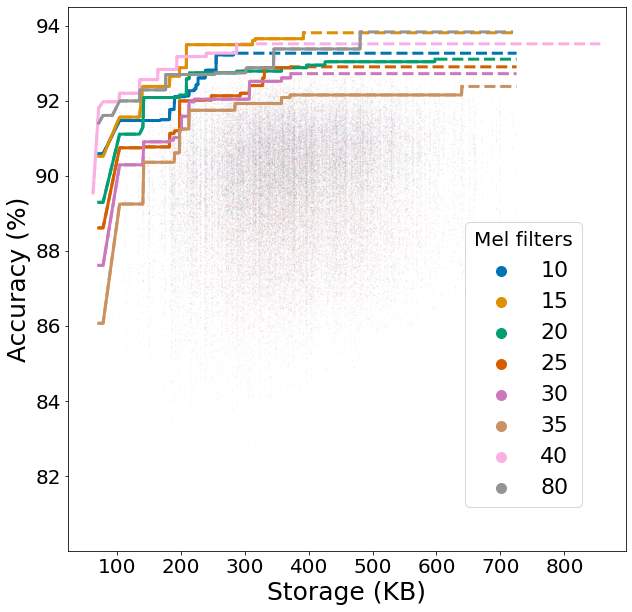

In [120]:
hue = "ft_extr_p0" 
lab_title = "Mel filters"
x = "net_info.flops" 
save_name = "results_imgs/lms_mels_flops_less30"


temp_df = df.copy()
# temp_df = temp_df[temp_df["params_id"] == 9]
temp_df = temp_df[temp_df["ft_extr_type"] == "mfcc"]
temp_df = temp_df[temp_df["net_info.flops"] <= 30]
plot_acc(temp_df, x, y, hue, save_name, lab_title, lsize, lalpha, psize, palpha)


x = "net_info.params" 
save_name = "results_imgs/lms_mels_storage_less30"
plot_acc(temp_df, x, y, hue, save_name, lab_title, lsize, lalpha, psize, palpha)


#### MFCC: Acc / FLOPs and Storage for Window length

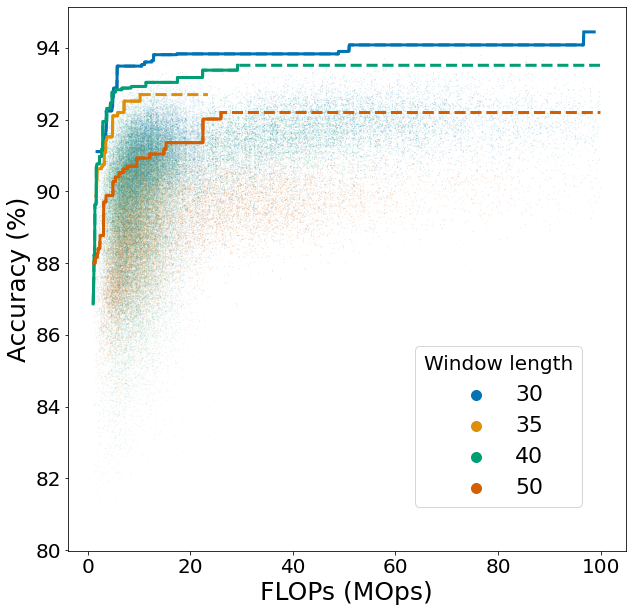

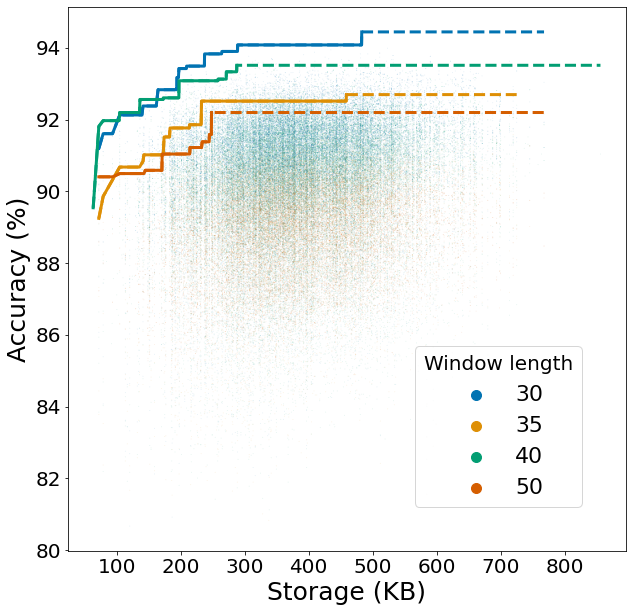

In [118]:
hue = "ft_extr_p1" 
lab_title = "Window length"
x = "net_info.flops" 
save_name = "results_imgs/mfcc_win_flops"
# save_name = "results_imgs/lms_mels_flops_less30"
y = "top1"
lsize = 3
lalpha = 1
psize = 1
palpha = .1

temp_df = df.copy()
temp_df = temp_df[temp_df["ft_extr_type"] == "mfcc"]
temp_df = temp_df[temp_df["net_info.flops"] <= 100]
plot_acc(temp_df, x, y, hue, save_name, lab_title, lsize, lalpha, psize, palpha)


x = "net_info.params" 
save_name = "results_imgs/mfcc_win_storage"
# save_name = "results_imgs/lms_mels_storage_less30"
plot_acc(temp_df, x, y, hue, save_name, lab_title, lsize, lalpha, psize, palpha)

#### Accuracy / FLOPs (MOPs) per feature extraction type, filtered for <=10

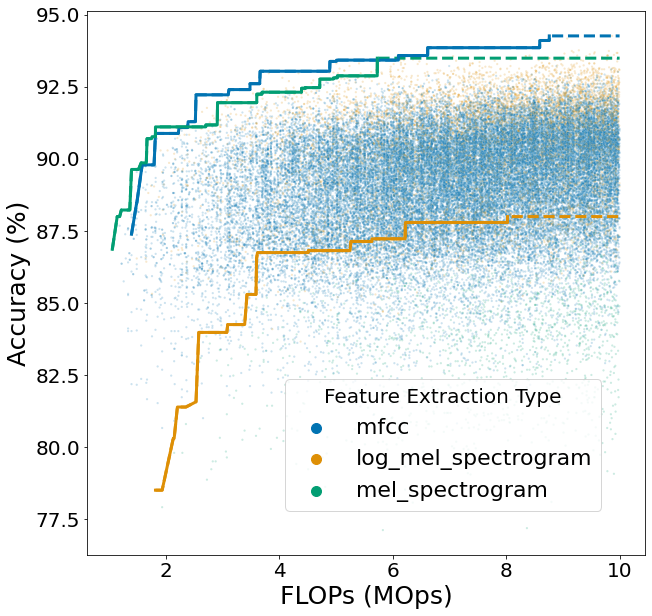

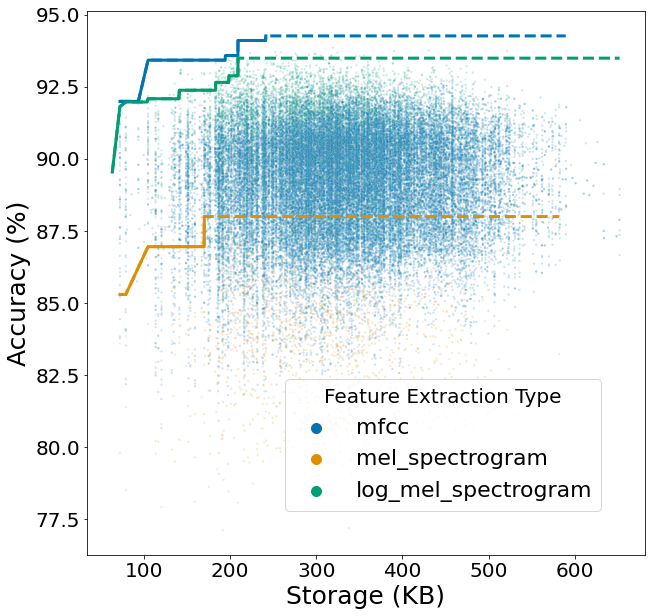

In [38]:
hue = "ft_extr_type" 
lab_title = "Feature Extraction Type"
x = "net_info.flops" 
save_name = "results_imgs/full_flops_less10"
psize = 5
palpha = .2

temp_df = df.copy()
# temp_df = temp_df[temp_df["ft_extr_type"] == "mel_spectrogram"]
temp_df = temp_df[temp_df["net_info.flops"] <= 10]
plot_acc(temp_df, x, y, hue, save_name, lab_title, lsize, lalpha, psize, palpha)


x = "net_info.params" 
save_name = "results_imgs/full_storage_less10"
# save_name = "results_imgs/lms_mels_storage_less30"
plot_acc(temp_df, x, y, hue, save_name, lab_title, lsize, lalpha, psize, palpha)


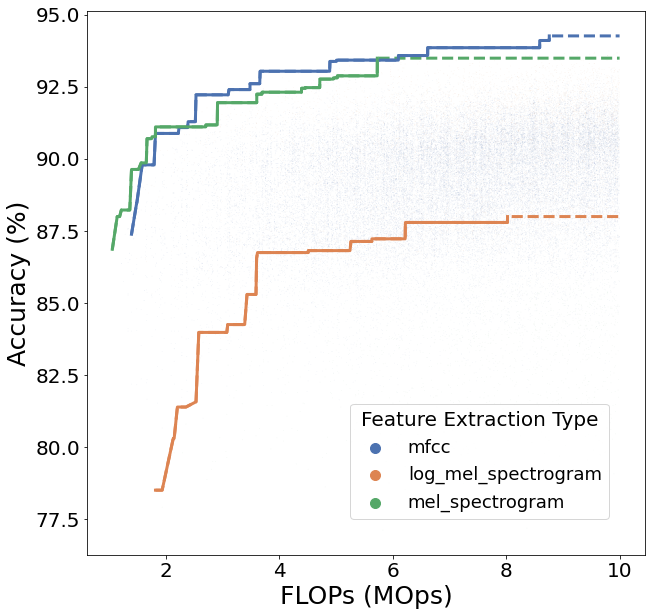

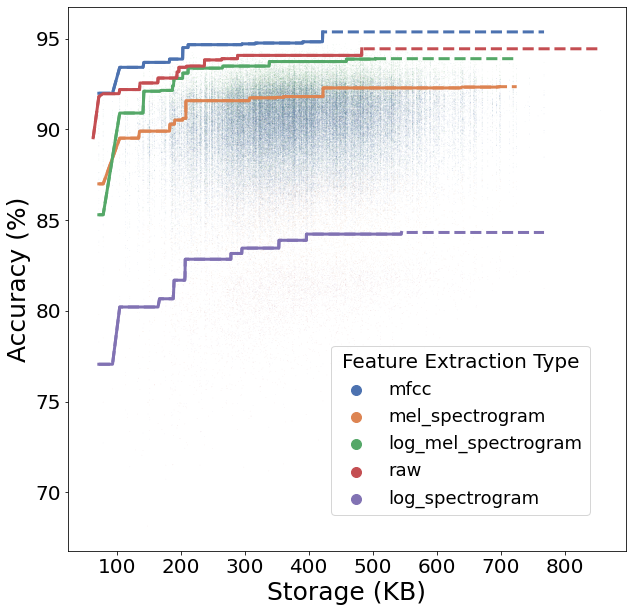

In [20]:
hue = "ft_extr_type" 
lab_title = "Feature Extraction Type"
x = "net_info.flops" 
save_name = "results_imgs/all_flops_v2_less10"


y = "top1"
lsize = 3
lalpha = 1
psize = .5
palpha = .1


temp_df = df.copy()
# temp_df = temp_df[(temp_df["ft_extr_type"] == "mfcc") | (temp_df["ft_extr_type"] == "log_mel_spectrogram")]

temp_df = temp_df[temp_df["net_info.flops"] <= 10]
plot_acc(temp_df, x, y, hue, save_name, lab_title, lsize, lalpha, psize, palpha)


x = "net_info.params" 
save_name = "results_imgs/all_storage_v2_less10"
# save_name = "results_imgs/lms_mels_storage_less30"
plot_acc(temp_df, x, y, hue, save_name, lab_title, lsize, lalpha, psize, palpha)


# LOG MEL SPECTROGRAM 

#### LMS: Accuracy / N of Mel filterbanks + filtered for <=30

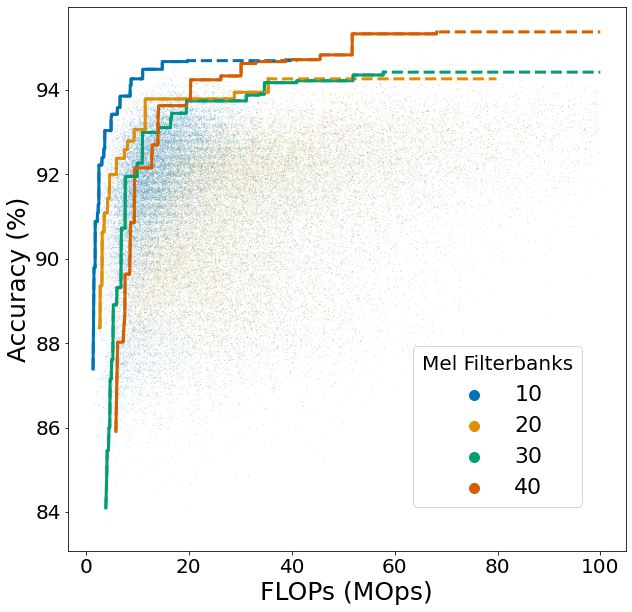

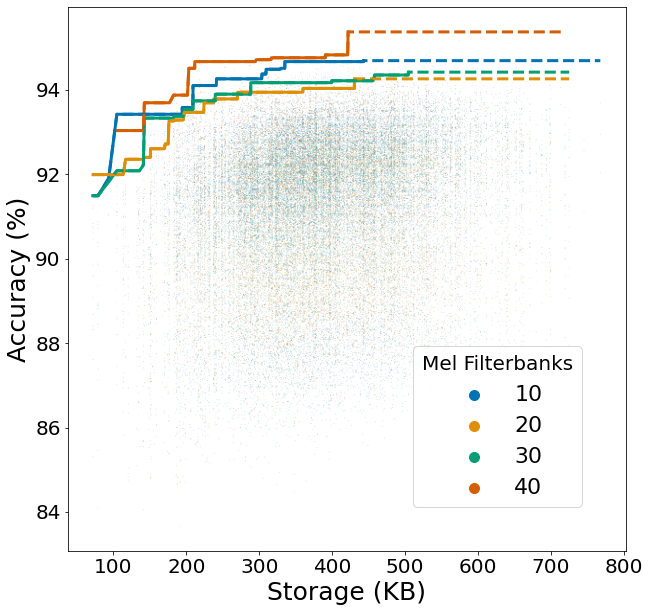

In [19]:
hue = "ft_extr_p0" 
lab_title = "Mel Filterbanks"
x = "net_info.flops" 
save_name = "results_imgs/lms_mels_flops"
# save_name = "results_imgs/lms_mels_flops_less30"


y = "top1"
lsize = 3
lalpha = 1
psize = 1
palpha = .2

temp_df = df.copy()
temp_df = temp_df[temp_df["ft_extr_type"] == "log_mel_spectrogram"]
temp_df = temp_df[temp_df["net_info.flops"] <= 100]
plot_acc(temp_df, x, y, hue, save_name, lab_title, lsize, lalpha, psize, palpha)


x = "net_info.params" 
save_name = "results_imgs/lms_mels_storage"
# save_name = "results_imgs/lms_mels_storage_less30"
plot_acc(temp_df, x, y, hue, save_name, lab_title, lsize, lalpha, psize, palpha)

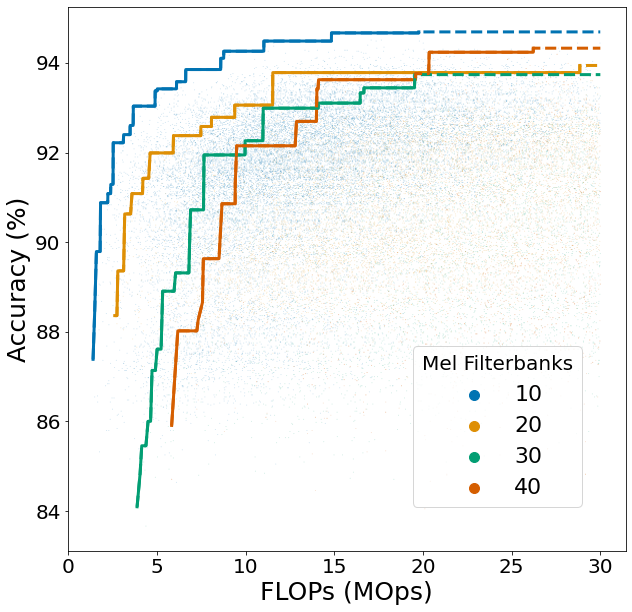

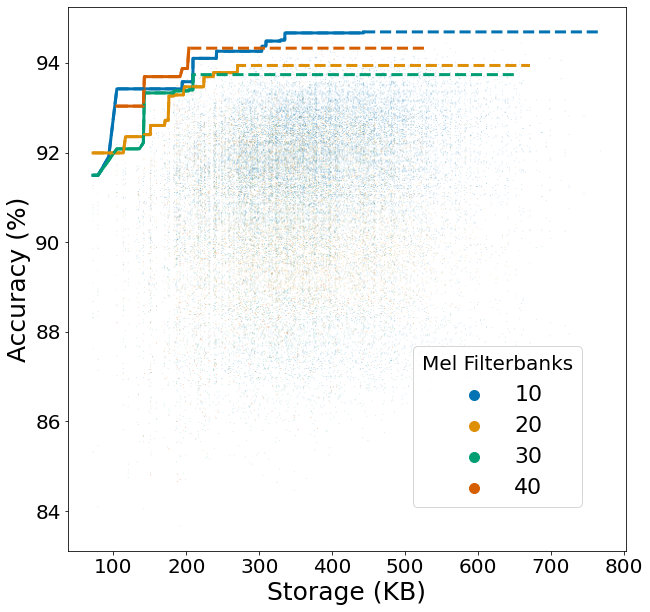

In [20]:
hue = "ft_extr_p0" 
lab_title = "Mel Filterbanks"
x = "net_info.flops" 
save_name = "results_imgs/lms_mels_flops_less30"


temp_df = df.copy()
temp_df = temp_df[temp_df["ft_extr_type"] == "log_mel_spectrogram"]
temp_df = temp_df[temp_df["net_info.flops"] <= 30]
plot_acc(temp_df, x, y, hue, save_name, lab_title, lsize, lalpha, psize, palpha)


x = "net_info.params" 
save_name = "results_imgs/lms_mels_storage_less30"
plot_acc(temp_df, x, y, hue, save_name, lab_title, lsize, lalpha, psize, palpha)


#### LMS: Accuracy / FLOPs and Storage for win length

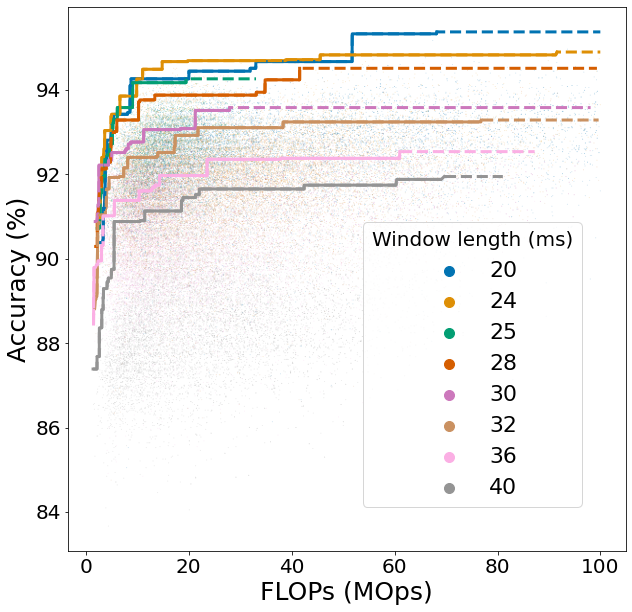

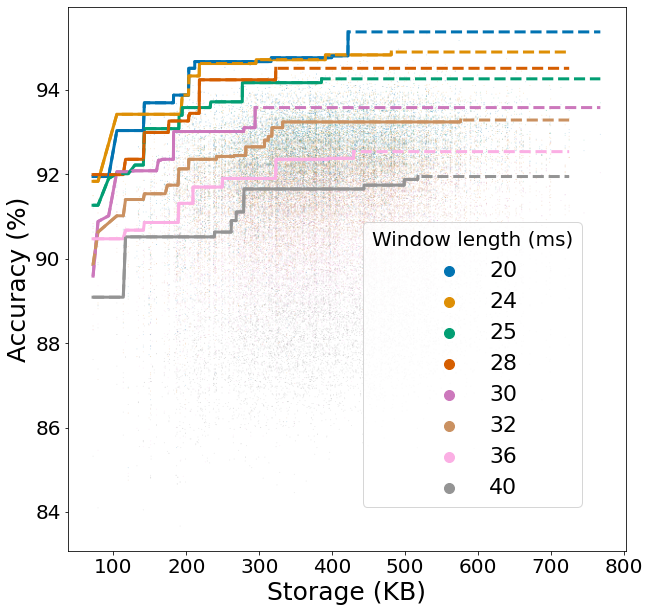

In [21]:
hue = "ft_extr_p1" 
lab_title = "Window length (ms)"
x = "net_info.flops" 
save_name = "results_imgs/lms_win_flops"


temp_df = df.copy()
temp_df = temp_df[temp_df["ft_extr_type"] == "log_mel_spectrogram"]
temp_df = temp_df[temp_df["net_info.flops"] <=100]

plot_acc(temp_df, x, y, hue, save_name, lab_title, lsize, lalpha, psize, palpha)


x = "net_info.params" 
save_name = "results_imgs/lms_win_storage"
plot_acc(temp_df, x, y, hue, save_name, lab_title, lsize, lalpha, psize, palpha)


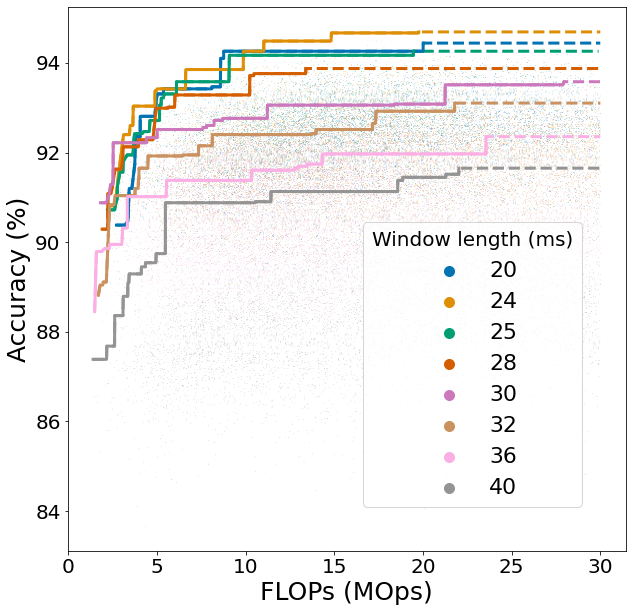

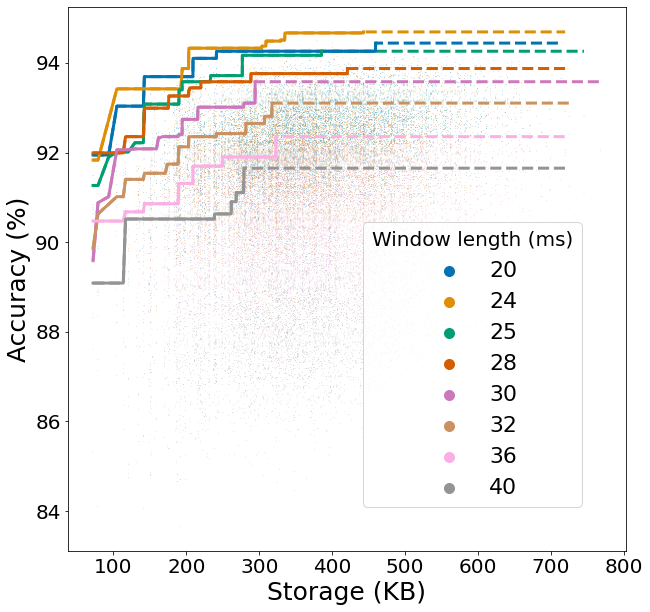

In [114]:
hue = "ft_extr_p1" 
lab_title = "Window length (ms)"
x = "net_info.flops" 
save_name = "results_imgs/lms_win_flops_less30"


temp_df = df.copy()
temp_df = temp_df[temp_df["ft_extr_type"] == "log_mel_spectrogram"]
temp_df = temp_df[temp_df["net_info.flops"] <= 30]
plot_acc(temp_df, x, y, hue, save_name, lab_title, lsize, lalpha, psize, palpha)


x = "net_info.params" 
save_name = "results_imgs/lms_win_storage_less30"
plot_acc(temp_df, x, y, hue, save_name, lab_title, lsize, lalpha, psize, palpha)


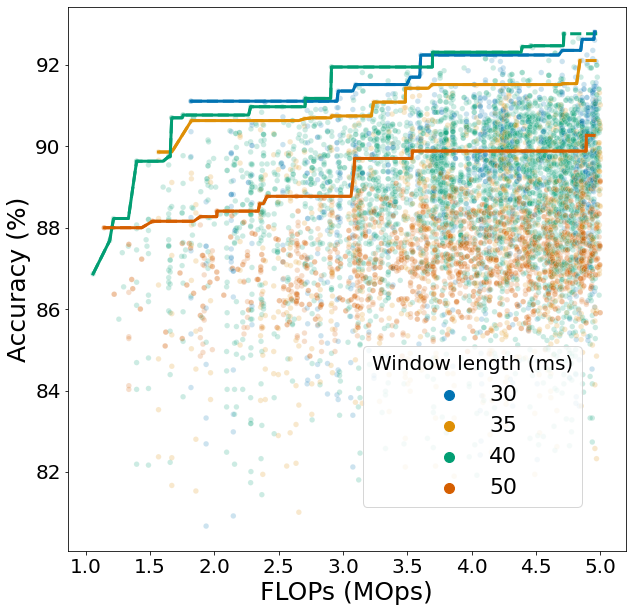

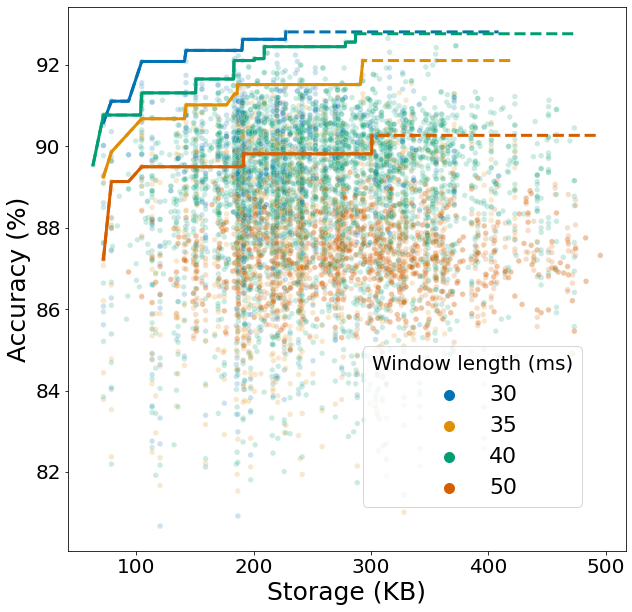

In [44]:
hue = "ft_extr_p1" 
lab_title = "Window length (ms)"
x = "net_info.flops" 
save_name = "results_imgs/mfcc_win_flops_less10"


y = "top1"
lsize = 3
lalpha = 1
psize = 30
palpha = .2

temp_df = df.copy()
temp_df = temp_df[temp_df["ft_extr_type"] == "mfcc"]
temp_df = temp_df[temp_df["net_info.flops"] <=5]

plot_acc(temp_df, x, y, hue, save_name, lab_title, lsize, lalpha, psize, palpha)


x = "net_info.params" 
save_name = "results_imgs/mfcc_win_storage_less10"
plot_acc(temp_df, x, y, hue, save_name, lab_title, lsize, lalpha, psize, palpha)


# Below are other plots alonside code used to extract table results for the overleaf report.

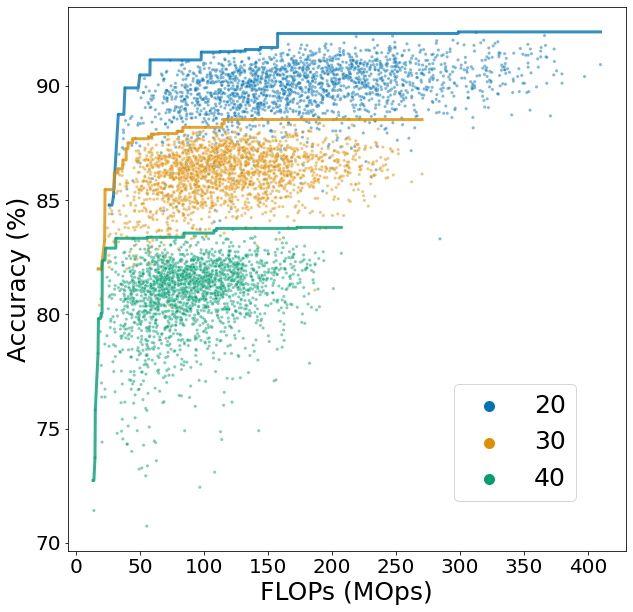

In [98]:
fig=plt.figure(figsize=(10,10))
plt.style.use('seaborn-dark-palette')

hue = "ft_extr_p1" # "params_id"
y = "top1"
x = "net_info.flops" #"net_info.MACs"

lsize = 3
lalpha = .8

psize = 10
palpha = .5
x_label = "FLOPs (MOps)"
y_label = "Accuracy (%)"

df2 = df.copy()
df2 = df2[df2["ft_extr_type"] == "log_spectrogram"]

sp = sns.scatterplot(x=x, y=y, hue=hue, data=df2, s=psize, alpha=palpha, palette="colorblind")


def max_rol(s): # s is `Series`
    newColumn = [0]
    for i, val in enumerate(s):
        newColumn.append(max(val,newColumn[i]))
    return newColumn[1:]


df2 = df2.sort_values(x)
df_p1 = df2[df2[hue] == 20]
df_p1 = df_p1.sort_values(x)
df_p2 = df2[df2[hue] == 30]
df_p2 = df_p2.sort_values(x)
df_p3 = df2[df2[hue] == 40]
df_p3 = df_p3.sort_values(x)

df_p1['maxtop1_a'] = df_p1[['top1']].apply(max_rol)
df_p2['maxtop1_b'] = df_p2[['top1']].apply(max_rol)
df_p3['maxtop1_c'] = df_p3[['top1']].apply(max_rol)

sns.lineplot(x=x, y="maxtop1_a", hue=None, data=df_p1, legend=False, linewidth=lsize, alpha=lalpha, color=sns.color_palette("colorblind")[0])
sns.lineplot(x=x, y="maxtop1_b", hue=None, data=df_p2, legend=False, linewidth=lsize, alpha=lalpha, color=sns.color_palette("colorblind")[1])
sns.lineplot(x=x, y="maxtop1_c", hue=None, data=df_p3, legend=False, linewidth=lsize, alpha=lalpha, color=sns.color_palette("colorblind")[2])


sp.set_ylabel(y_label,fontsize=25)
sp.set_xlabel(x_label,fontsize=25)

sp.tick_params(labelsize=20)
# Put the legend out of the figure
lgnd = plt.legend(loc="lower right", borderaxespad=2, fontsize=25)
lgnd.legendHandles[0]._sizes = [100]
lgnd.legendHandles[1]._sizes = [100]
lgnd.legendHandles[2]._sizes = [100]

# Plot legend.
plt.show()

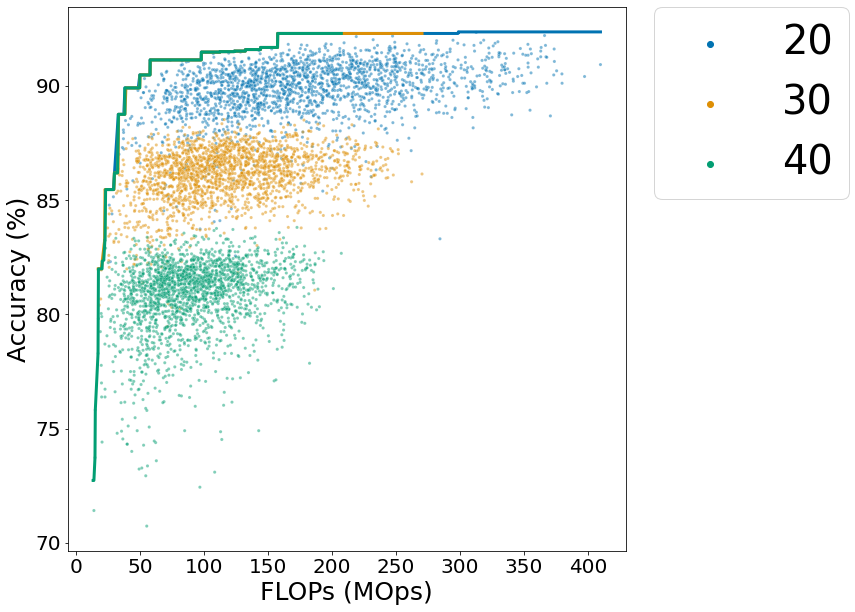

In [84]:
fig=plt.figure(figsize=(10,10))
plt.style.use('seaborn-dark-palette')

hue = "ft_extr_p1" # "params_id"
y = "top1"
x = "net_info.flops" #"net_info.MACs"

lsize = 3
lalpha = 1

psize = 10
palpha = .5
x_label = "FLOPs (MOps)"
y_label = "Accuracy (%)"

df2 = df.copy()
df2 = df2[df2["ft_extr_type"] == "log_spectrogram"]

sp = sns.scatterplot(x=x, y=y, hue=hue, data=df2, s=psize, alpha=palpha, palette="colorblind")


def max_rol(s): # s is `Series`
    newColumn = [0]
    for i, val in enumerate(s):
        newColumn.append(max(val,newColumn[i]))
    return newColumn[1:]


df2 = df2.sort_values(x)

df2['maxtop1'] = df2[['top1']].apply(max_rol)

sns.lineplot(x=x, y="maxtop1", hue=hue, data=df2, legend=False, linewidth=lsize, alpha=lalpha, palette="colorblind")
sp.set_ylabel(y_label,fontsize=25)
sp.set_xlabel(x_label,fontsize=25)

sp.tick_params(labelsize=20)
# Put the legend out of the figure
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

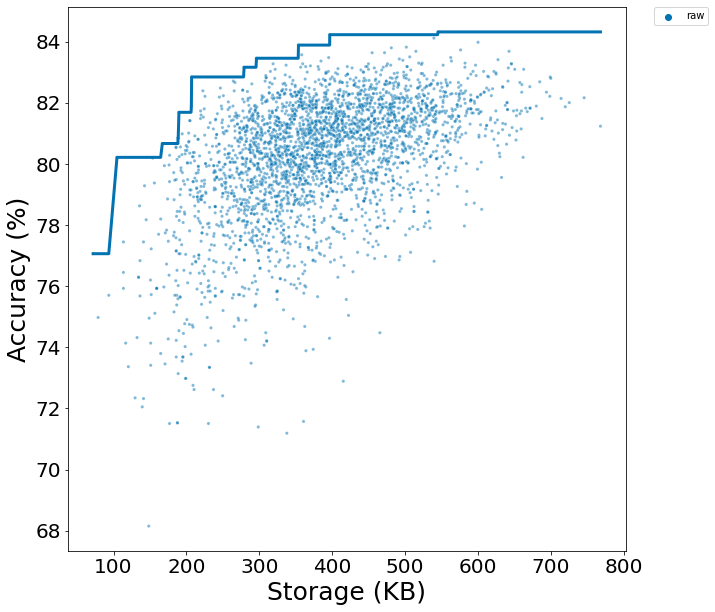

In [65]:
fig=plt.figure(figsize=(10,10))
plt.style.use('seaborn-dark-palette')

hue = "ft_extr_type" # "params_id"
y = "top1"
x = "net_info.params" #"net_info.MACs"

lsize = 3
lalpha = 1

psize = 10
palpha = .5
points_base = .01
x_label = "Storage (KB)"
y_label = "Accuracy (%)"

df2 = df.copy()
df2 = df2[df2["ft_extr_type"] == "raw"]

df2["net_info.params"] = df2["net_info.params"] * 2
sp = sns.scatterplot(x=x, y=y, hue=hue, data=df2, s=psize, alpha=palpha, palette="colorblind")


def max_rol(s): # s is `Series`
    newColumn = [0]
    for i, val in enumerate(s):
        newColumn.append(max(val,newColumn[i]))
    return newColumn[1:]


df2 = df2.sort_values("net_info.params")

df2['maxtop1'] = df2[['top1']].apply(max_rol)

sns.lineplot(x=x, y="maxtop1", hue=hue, data=df2, legend=False, linewidth=lsize, alpha=lalpha, palette="colorblind")
sp.set_ylabel(y_label,fontsize=25)
sp.set_xlabel(x_label,fontsize=25)

sp.tick_params(labelsize=20)
# Put the legend out of the figure
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

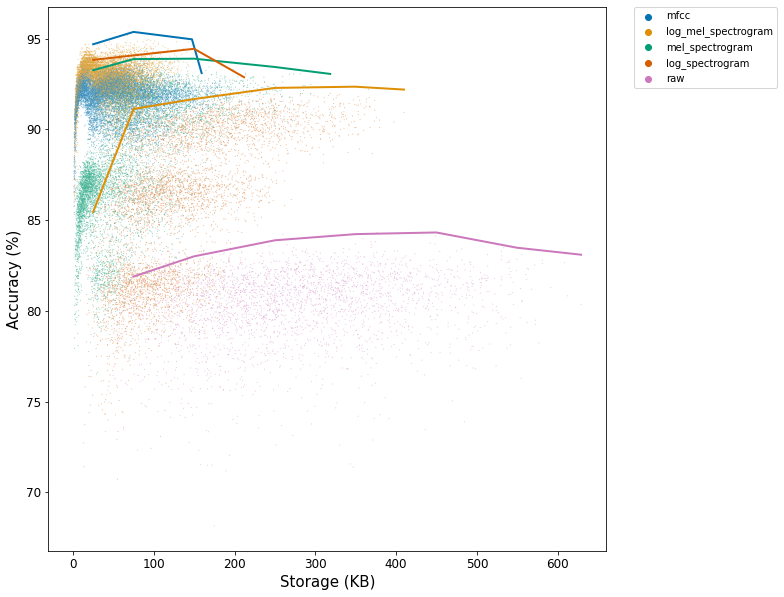

In [39]:
def plot_points_max_lines(df,x,y,hue,points_base, psize, palpha,lsize,laplhpa, base_func, x_label, y_label):
    tdf = df.copy()
    
    # top_df = remove_worse(tdf, x, y, hue, points_base)
    sp = sns.scatterplot(x=x, y=y, hue=hue, data=top_df, s=psize, alpha=palpha, palette="colorblind")
    
    ttdf = df.copy()
    x_col = "rnd_" + x
    ttdf[x_col] = ttdf[x].apply(lambda val: base_func(num=val)) # build col with rounded val
    maxi = ttdf.groupby([x_col,hue]).max().reset_index() # For all same rounded x values, remove non max y
    
    sns.lineplot(x=x, y=y, hue=hue, data=maxi, legend=False, linewidth=lsize, alpha=lalpha, palette="colorblind")

    sp.set_ylabel(y_label,fontsize=15)
    sp.set_xlabel(x_label,fontsize=15)

    sp.tick_params(labelsize=12)
    # Put the legend out of the figure
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.show()
    

def base_func(num):
    if num < 100:
        base = 50
    else:
        base = 100
    return base * round(num / base)

fig=plt.figure(figsize=(10,10))
plt.style.use('seaborn-dark-palette')

hue = "ft_extr_type" # "params_id"
y = "top1"
x = "net_info.flops" #"net_info.MACs"

lsize = 2
lalpha = 1

psize = 1
palpha = .5
points_base = .01
x_label = "Storage (KB)"
y_label = "Accuracy (%)"
df2 = df.copy()
# df2 = df2[df2["net_info.flops"] <=10]
# df2["net_info.MACs"] = df2["net_info.MACs"] * 2 / 1000000

df2["net_info.params"] = df2["net_info.params"] * 2

# df2["net_info.MACs"] = df2["net_info.MACs"] * 2 / 1000

# df2 = df2[(df2["ft_extr_type"] == "log_mel_spectrogram") |(df2["ft_extr_type"] == "mel_spectrogram")]
# df2 = remove_worse(df2, x, y, hue, base=.1)


plot_points_max_lines(df2,x,y,hue,points_base, psize, palpha, lsize, lalpha, base_func, x_label, y_label)

In [ ]:
### SUMMARY TABLE ACCURACY / FT_EXTR_P0 FOR SPECIFIC FT EXTR TYPE,
index = "ft_extr"

temp_df = df.copy()
temp_df = temp_df[temp_df["ft_extr_type"] == "raw"]

temp_df["Storage"] = temp_df["net_info.params"] * 2


# temp_df = temp_df[temp_df["top1"]>100]

def q1(x):
    return x.quantile(0.25)

def q3(x):
    return x.quantile(0.75)

def q095(x):
    return x.quantile(0.95)


f = {"top1": ['max', 'mean', 'min'], "net_info.flops": ['max', 'mean', 'min'], "Storage": ['max', 'mean', 'min']}
sum_df = temp_df.groupby(index).agg(f)
acc_df = sum_df["top1"]
acc_df = acc_df.rename(columns={"max":"Max Accuracy", "mean":"Mean Accuracy", "min": "Min Accuracy"})

flops_df = sum_df["net_info.flops"]
flops_df = flops_df.rename(columns={"max":"Max FLOPs", "mean":"Mean FLOPs", "min": "Min FLOPs"})


sto_df = sum_df["Storage"]
sto_df = sto_df.rename(columns={"max":"Max Storage", "mean":"Mean Storage", "min": "Min Storage"})

sum_df = acc_df.join(flops_df)
sum_df = sum_df.join(sto_df)
sum_df.round(2)


for i, row in sum_df.iterrows():
    s = ""
    s += str(i)
    for col in sum_df.columns:
        s += " & " + str(round(row[col], 2))
    s += " \\\ \midrule"
    print(s)
    
sum_df
#sum_df.sort_values("Highest Accuracy", ascending=False)

In [34]:
### SUMMARY TABLE ACCURACY / FT_EXTR_P0 FOR SPECIFIC FT EXTR TYPE,
index = "ft_extr"

temp_df = df.copy()
temp_df = temp_df[temp_df["ft_extr_type"] == "raw"]

temp_df["Storage"] = temp_df["net_info.params"] * 2


# temp_df = temp_df[temp_df["top1"]>100]

def q1(x):
    return x.quantile(0.25)

def q3(x):
    return x.quantile(0.75)

def q095(x):
    return x.quantile(0.95)


f = {"top1": ['max', 'mean', 'min'], "net_info.flops": ['max', 'mean', 'min'], "Storage": ['max', 'mean', 'min']}
sum_df = temp_df.groupby(index).agg(f)
acc_df = sum_df["top1"]
acc_df = acc_df.rename(columns={"max":"Max Accuracy", "mean":"Mean Accuracy", "min": "Min Accuracy"})

flops_df = sum_df["net_info.flops"]
flops_df = flops_df.rename(columns={"max":"Max FLOPs", "mean":"Mean FLOPs", "min": "Min FLOPs"})


sto_df = sum_df["Storage"]
sto_df = sto_df.rename(columns={"max":"Max Storage", "mean":"Mean Storage", "min": "Min Storage"})

sum_df = acc_df.join(flops_df)
sum_df = sum_df.join(sto_df)
sum_df.round(2)


for i, row in sum_df.iterrows():
    s = ""
    s += str(i)
    for col in sum_df.columns:
        s += " & " + str(round(row[col], 2))
    s += " \\\ \midrule"
    print(s)
    
sum_df
#sum_df.sort_values("Highest Accuracy", ascending=False)

raw1_(125, 128) & 84.32 & 80.27 & 68.15 & 628.99 & 272.29 & 39.15 & 767.9 & 384.1 & 72.09 \\ \midrule


,Max Accuracy,Mean Accuracy,Min Accuracy,Max FLOPs,Mean FLOPs,Min FLOPs,Max Storage,Mean Storage,Min Storage
ft_extr,,,,,,,,,
"raw1_(125, 128)",84.323957,80.272388,68.148821,628.994816,272.287157,39.14624,767.896,384.103547,72.088


In [ ]:
### SUMMARY TABLE ACCURACY / FT_EXTR_P0 FOR SPECIFIC FT EXTR TYPE,
index = "ft_extr"

temp_df = df.copy()
temp_df = temp_df[temp_df["ft_extr_type"] == "raw"]

temp_df["Storage"] = temp_df["net_info.params"] * 2


# temp_df = temp_df[temp_df["top1"]>100]

def q1(x):
    return x.quantile(0.25)

def q3(x):
    return x.quantile(0.75)

def q095(x):
    return x.quantile(0.95)


f = {"top1": ['max', 'mean', 'min'], "net_info.flops": ['max', 'mean', 'min'], "Storage": ['max', 'mean', 'min']}
sum_df = temp_df.groupby(index).agg(f)
acc_df = sum_df["top1"]
acc_df = acc_df.rename(columns={"max":"Max Accuracy", "mean":"Mean Accuracy", "min": "Min Accuracy"})

flops_df = sum_df["net_info.flops"]
flops_df = flops_df.rename(columns={"max":"Max FLOPs", "mean":"Mean FLOPs", "min": "Min FLOPs"})


sto_df = sum_df["Storage"]
sto_df = sto_df.rename(columns={"max":"Max Storage", "mean":"Mean Storage", "min": "Min Storage"})

sum_df = acc_df.join(flops_df)
sum_df = sum_df.join(sto_df)
sum_df.round(2)


for i, row in sum_df.iterrows():
    s = ""
    s += str(i)
    for col in sum_df.columns:
        s += " & " + str(round(row[col], 2))
    s += " \\\ \midrule"
    print(s)
    
sum_df
#sum_df.sort_values("Highest Accuracy", ascending=False)

In [ ]:
top acc, mean acc, min flops, max flops, mean flops, min memory, max memory, avg memory, min storage, max storage, avg storage

In [9]:
### SUMMARY TABLE ACCURACY / FT_EXTR_P0 FOR SPECIFIC FT EXTR TYPE,
index = "ft_extr_type"

temp_df = df.copy()
# temp_df = temp_df[temp_df["ft_extr_type"] == "mfcc"]

temp_df["Storage"] = temp_df["net_info.params"] * 2


# temp_df = temp_df[temp_df["top1"]>100]

def q1(x):
    return x.quantile(0.25)

def q3(x):
    return x.quantile(0.75)

def q095(x):
    return x.quantile(0.95)


f = {"top1": ['max', 'mean', 'min'], "net_info.flops": ['max', 'mean', 'min'], "Storage": ['max', 'mean', 'min']}
sum_df = temp_df.groupby(index).agg(f)
acc_df = sum_df["top1"]
acc_df = acc_df.rename(columns={"max":"Max Accuracy", "mean":"Mean Accuracy", "min": "Min Accuracy"})

flops_df = sum_df["net_info.flops"]
flops_df = flops_df.rename(columns={"max":"Max FLOPs", "mean":"Mean FLOPs", "min": "Min FLOPs"})


sto_df = sum_df["Storage"]
sto_df = sto_df.rename(columns={"max":"Max Storage", "mean":"Mean Storage", "min": "Min Storage"})

sum_df = acc_df.join(flops_df)
sum_df = sum_df.join(sto_df)
sum_df.round(2)


for i, row in sum_df.iterrows():
    s = ""
    s += str(i)
    for col in sum_df.columns:
        s += " & " + str(round(row[col], 2))
    s += " \\\ \midrule"
    print(s)
    
sum_df
#sum_df.sort_values("Highest Accuracy", ascending=False)

log_mel_spectrogram & 95.37 & 91.21 & 83.67 & 159.27 & 28.08 & 1.39 & 767.9 & 383.64 & 72.09 \\ \midrule
log_spectrogram & 92.35 & 85.58 & 70.74 & 409.72 & 128.94 & 13.22 & 725.14 & 383.26 & 72.09 \\ \midrule
mel_spectrogram & 93.9 & 86.97 & 74.82 & 318.44 & 55.67 & 1.82 & 725.14 & 383.99 & 72.09 \\ \midrule
mfcc & 94.44 & 90.04 & 80.67 & 211.82 & 21.52 & 1.06 & 856.09 & 384.18 & 63.26 \\ \midrule
raw & 84.32 & 80.27 & 68.15 & 628.99 & 272.29 & 39.15 & 767.9 & 384.1 & 72.09 \\ \midrule


,Max Accuracy,Mean Accuracy,Min Accuracy,Max FLOPs,Mean FLOPs,Min FLOPs,Max Storage,Mean Storage,Min Storage
ft_extr_type,,,,,,,,,
log_mel_spectrogram,95.372051,91.205381,83.666062,159.273152,28.083102,1.394880,767.896,383.640998,72.088
log_spectrogram,92.354810,85.581433,70.735027,409.719168,128.935371,13.217152,725.144,383.260587,72.088
mel_spectrogram,93.897459,86.969850,74.818510,318.444288,55.669907,1.817408,725.144,383.987976,72.088
mfcc,94.441924,90.036074,80.671507,211.821568,21.524907,1.056448,856.088,384.183245,63.256
raw,84.323957,80.272388,68.148821,628.994816,272.287157,39.146240,767.896,384.103547,72.088


In [33]:
### SUMMARY TABLE ACCURACY / FT_EXTR_P0 FOR SPECIFIC FT EXTR TYPE,
index = "ft_extr_type"

temp_df = df.copy()
# temp_df = temp_df[temp_df["ft_extr_type"] == "mfcc"]

temp_df["Storage"] = temp_df["net_info.params"] * 2


# temp_df = temp_df[temp_df["top1"]>100]

def q1(x):
    return x.quantile(0.25)

def q3(x):
    return x.quantile(0.75)

def q095(x):
    return x.quantile(0.95)


f = {"top1": ['max', 'mean', 'min'], "net_info.flops": ['max', 'mean', 'min'], "Storage": ['max', 'mean', 'min']}
sum_df = temp_df.groupby(index).agg(f)
acc_df = sum_df["top1"]
acc_df = acc_df.rename(columns={"max":"Max Accuracy", "mean":"Mean Accuracy", "min": "Min Accuracy"})

flops_df = sum_df["net_info.flops"]
flops_df = flops_df.rename(columns={"max":"Max FLOPs", "mean":"Mean FLOPs", "min": "Min FLOPs"})


sto_df = sum_df["Storage"]
sto_df = sto_df.rename(columns={"max":"Max Storage", "mean":"Mean Storage", "min": "Min Storage"})

sum_df = acc_df.join(flops_df)
sum_df = sum_df.join(sto_df)
sum_df.round(2)


for i, row in sum_df.iterrows():
    s = ""
    s += str(i)
    for col in sum_df.columns:
        s += " & " + str(round(row[col], 2))
    s += " \\\ \midrule"
    print(s)
    
sum_df
#sum_df.sort_values("Highest Accuracy", ascending=False)

log_mel_spectrogram & 95.37 & 91.21 & 83.67 & 159.27 & 28.08 & 1.39 & 767.9 & 383.64 & 72.09 \\ \midrule
log_spectrogram & 92.35 & 85.58 & 70.74 & 409.72 & 128.94 & 13.22 & 725.14 & 383.26 & 72.09 \\ \midrule
mel_spectrogram & 93.9 & 86.97 & 74.82 & 318.44 & 55.67 & 1.82 & 725.14 & 383.99 & 72.09 \\ \midrule
mfcc & 94.44 & 90.04 & 80.67 & 211.82 & 21.52 & 1.06 & 856.09 & 384.18 & 63.26 \\ \midrule
raw & 84.32 & 80.27 & 68.15 & 628.99 & 272.29 & 39.15 & 767.9 & 384.1 & 72.09 \\ \midrule


,Max Accuracy,Mean Accuracy,Min Accuracy,Max FLOPs,Mean FLOPs,Min FLOPs,Max Storage,Mean Storage,Min Storage
ft_extr_type,,,,,,,,,
log_mel_spectrogram,95.372051,91.205381,83.666062,159.273152,28.083102,1.394880,767.896,383.640998,72.088
log_spectrogram,92.354810,85.581433,70.735027,409.719168,128.935371,13.217152,725.144,383.260587,72.088
mel_spectrogram,93.897459,86.969850,74.818510,318.444288,55.669907,1.817408,725.144,383.987976,72.088
mfcc,94.441924,90.036074,80.671507,211.821568,21.524907,1.056448,856.088,384.183245,63.256
raw,84.323957,80.272388,68.148821,628.994816,272.287157,39.146240,767.896,384.103547,72.088


135302
135302
mfcc & 94.44 & 90.04 & 80.67 & 211.82 & 21.52 & 1.06 & 33447.94 & 3587.32 & -0.0 & 856.09 & 384.18 & 63.26 \\ \midrule


,Max Accuracy,Mean Accuracy,Min Accuracy,Max FLOPs,Mean FLOPs,Min FLOPs,Max Memory,Mean Memory,Min Memory,Max Storage,Mean Storage,Min Storage
ft_extr_type,,,,,,,,,,,,
mfcc,94.441924,90.036074,80.671507,211.821568,21.524907,1.056448,33447.936,3587.315895,-0.002,856.088,384.183245,63.256


In [10]:
### SUMMARY TABLE ACCURACY / FT_EXTR_P0 FOR SPECIFIC FT EXTR TYPE,
index = "ft_extr_type"

temp_df = df.copy()

def q1(x):
    return x.quantile(0.25)

def q3(x):
    return x.quantile(0.75)

def q095(x):
    return x.quantile(0.95)

f = {'top1': ['max', 'mean', 'std', q1, 'median', q3, q095]}
sum_df = temp_df.groupby(index).agg(f)
sum_df = sum_df.rename(columns={"max":"Highest Accuracy", "mean":"Average Accuracy", "std": "Std Dev", "q1":"Q1", "median":"Median", "q3":"Q3", "q095":"Q.95"})
sum_df = sum_df['top1']
sum_df.sort_values("Highest Accuracy", ascending=False)

,Highest Accuracy,Average Accuracy,Std Dev,Q1,Median,Q3,Q.95
ft_extr_type,,,,,,,
log_mel_spectrogram,95.372051,91.205381,1.708812,90.108893,91.583485,92.490926,93.421053
mfcc,94.441924,90.036074,1.684898,89.042650,90.313067,91.288566,92.286751
mel_spectrogram,93.897459,86.969850,3.428528,84.618875,86.569874,90.199637,92.377496
log_spectrogram,92.354810,85.581433,3.932192,81.851180,86.229583,89.246824,90.925590
raw,84.323957,80.272388,1.909310,79.367060,80.626134,81.601633,82.645191


In [81]:
### SUMMARY TABLE ACCURACY / FT_EXTR_P0 FOR SPECIFIC FT EXTR TYPE,
index1, index2 = "ft_extr_p0", "ft_extr_p1"

temp_df = df.copy()
temp_df = temp_df[temp_df["ft_extr_type"] == "mfcc"]
temp_df["mfcc_params"] = temp_df.apply(lambda x: str(x.ft_extr_p0) + " & "+ str(x.ft_extr_p1),axis=1)

# temp_df = temp_df[temp_df["top1"]>100]

def q1(x):
    return x.quantile(0.25)

def q3(x):
    return x.quantile(0.75)

def q095(x):
    return x.quantile(0.95)

f = {'top1': ['max', 'mean', 'std', q1, 'median', q3, q095]}
sum_df = temp_df.groupby(["mfcc_bins", "ft_extr_p0", "ft_extr_p1"]).agg(f)
sum_df = sum_df.rename(columns={"max":"Highest Accuracy", "mean":"Average Accuracy", "std": "Std Dev", "q1":"Q1", "median":"Median", "q3":"Q3", "q095":"Q.95"})
print(sum_df)
# sum_df = sum_df['top1']

for i, row in sum_df.iterrows():
    s = "" 
    s += str(i[0]) + " & " + str(i[1]) + " & " + str(i[2])
    for col in sum_df.columns:
        s += " & " + str(round(row[col], 2))
    s += " \\\ \midrule"
    print(s)
    
sum_df
#sum_df.sort_values("Highest Accuracy", ascending=False)

                                            top1                             \
                                Highest Accuracy Average Accuracy   Std Dev   
mfcc_bins ft_extr_p0 ft_extr_p1                                               
10        10         30                92.763158        90.826328  0.772804   
                     40                91.946461        90.101555  0.799287   
                     50                89.314882        87.260777  0.713834   
          40         30                93.443740        90.826124  0.847802   
                     40                93.035390        90.611038  0.898740   
                     50                90.630672        88.276690  0.979061   
          80         30                93.829401        91.100023  1.034529   
                     40                92.990018        90.557226  0.832912   
                     50                90.744102        88.216233  0.847877   
40        10         30                93.262251    

top1                             \
                                Highest Accuracy Average Accuracy   Std Dev   
mfcc_bins ft_extr_p0 ft_extr_p1                                               
10        10         30                92.763158        90.826328  0.772804   
                     40                91.946461        90.101555  0.799287   
                     50                89.314882        87.260777  0.713834   
          40         30                93.443740        90.826124  0.847802   
                     40                93.035390        90.611038  0.898740   
                     50                90.630672        88.276690  0.979061   
          80         30                93.829401        91.100023  1.034529   
                     40                92.990018        90.557226  0.832912   
                     50                90.744102        88.216233  0.847877   
40        10         30                93.262251        91.238047  0.681049   
                     35                92.309437        90.337221  0.626415   
                     40                92.218693        89.881320  0.778403   
          15         30                93.806715        91.685897  0.835605   
                     35                92.695100        90.317460  0.752602   
                     40                93.171507        90.124303  0.935125   
          20         30                93.103448        90.798373  1.069963   
                     35                91.969147        89.562217  0.957465   
                     40                92.127949        89.169526  1.032856   
          25         30                92.899274        90.133626  1.261305   
                     35                91.628857        89.001319  1.141514   
                     40                91.175136        88.300863  1.120128   
          30         30                92.717786        89.553463  1.468599   
                     35                92.082577        88.490217  1.300941   
                     40                91.129764        87.835578  1.187972   
          35         30                92.377496        88.783781  1.610388   
                     35                91.651543        88.003413  1.497187   
                     40                90.789474        87.448613  1.318844   
          40         30                94.441924        90.659014  2.160960   
                     35                90.902904        87.198643  1.780774   
                     40                93.511797        90.042952  2.315065   
                     50                91.946461        89.689386  0.693162   
          80         30                93.647913        91.622118  0.787583   
                     40                93.375681        91.356297  0.846166   
                     50                92.196007        89.465912  0.852861   
80        80         30                93.126135        91.629485  0.628166   
                     40                93.330309        91.665689  0.599753   
                     50                91.719601        89.799458  0.693789   

                                                                             
                                        Q1     Median         Q3       Q.95  
mfcc_bins ft_extr_p0 ft_extr_p1                                              
10        10         30          90.358442  90.925590  91.379311  91.901092  
                     40          89.609801  90.199637  90.676042  91.243198  
                     50          86.819420  87.273140  87.749545  88.384755  
          40         30          90.335757  90.880220  91.401999  92.082577  
                     40          90.131579  90.676044  91.197822  91.946461  
                     50          87.613431  88.407441  88.997278  89.700545  
          80         30          90.562615  91.175136  91.833031  92.513613  
                     40          90.080536  90.630672  91.129765  91.764973  
                     50  

In [62]:
### SUMMARY TABLE ACCURACY / FT_EXTR_P0 FOR SPECIFIC FT EXTR TYPE,
index1, index2 = "ft_extr_p0", "ft_extr_p1"

temp_df = df.copy()
temp_df = temp_df[temp_df["ft_extr_type"] == "log_mel_spectrogram"]
temp_df["mel_params"] = temp_df.apply(lambda x: str(x.ft_extr_p0) + " & "+ str(x.ft_extr_p1),axis=1)

# temp_df = temp_df[temp_df["top1"]>100]

def q1(x):
    return x.quantile(0.25)

def q3(x):
    return x.quantile(0.75)

def q095(x):
    return x.quantile(0.95)

f = {'top1': ['max', 'mean', 'std', q1, 'median', q3, q095]}
sum_df = temp_df.groupby(["ft_extr_p0", "ft_extr_p1"]).agg(f)
sum_df = sum_df.rename(columns={"max":"Highest Accuracy", "mean":"Average Accuracy", "std": "Std Dev", "q1":"Q1", "median":"Median", "q3":"Q3", "q095":"Q.95"})
print(sum_df)
# sum_df = sum_df['top1']

for i, row in sum_df.iterrows():
    s = ""
    s += str(i[0]) + " & " + str(i[1])
    for col in sum_df.columns:
        s += " & " + str(round(row[col], 2))
    s += " \\\ \midrule"
    print(s)
    
sum_df
#sum_df.sort_values("Highest Accuracy", ascending=False)

                                  top1                                        \
                      Highest Accuracy Average Accuracy   Std Dev         Q1   
ft_extr_p0 ft_extr_p1                                                          
10         20                94.441924        92.447249  0.839819  91.991833   
           24                94.691470        92.942104  0.688677  92.513612   
           25                94.260436        92.483826  0.734031  92.037206   
           28                93.874773        92.049008  0.658202  91.628857   
           30                93.058077        91.462307  0.606338  91.084392   
           32                92.513612        90.886812  0.645103  90.494555   
           36                91.969147        89.811728  0.677793  89.360254   
           40                89.768603        87.762745  0.752406  87.295826   
20         20                94.260436        92.378301  0.775097  91.991833   
           24                93.738657  

top1                                        \
                      Highest Accuracy Average Accuracy   Std Dev         Q1   
ft_extr_p0 ft_extr_p1                                                          
10         20                94.441924        92.447249  0.839819  91.991833   
           24                94.691470        92.942104  0.688677  92.513612   
           25                94.260436        92.483826  0.734031  92.037206   
           28                93.874773        92.049008  0.658202  91.628857   
           30                93.058077        91.462307  0.606338  91.084392   
           32                92.513612        90.886812  0.645103  90.494555   
           36                91.969147        89.811728  0.677793  89.360254   
           40                89.768603        87.762745  0.752406  87.295826   
20         20                94.260436        92.378301  0.775097  91.991833   
           24                93.738657        92.143849  0.616833  91.810345   
           28                93.421053        92.001128  0.549282  91.674229   
           32                92.831216        90.919462  0.640476  90.539928   
           36                91.764973        89.786749  0.688792  89.337568   
           40                91.333939        89.332212  0.698672  88.861162   
30         20                93.920145        91.891375  1.051287  91.401997   
           24                94.419238        92.281384  0.987016  91.810345   
           28                93.693285        91.628721  0.974212  91.163793   
           32                93.239565        90.665410  1.050349  90.086207   
           36                92.354810        89.584084  1.106903  88.951906   
           40                90.426498        87.985152  0.933696  87.431942   
40         20                95.372051        92.975643  0.914419  92.604356   
           24                94.895644        92.699887  1.043586  92.150636   
           28                94.509982        92.343807  0.941889  91.810345   
           30                93.579855        91.727019  0.777387  91.243195   
           32                93.284937        91.301679  0.908371  90.902904   
           36                92.536298        90.291153  1.047474  89.768603   
           40                91.946461        88.708356  1.126571  88.021779   

                                                        
                          Median         Q3       Q.95  
ft_extr_p0 ft_extr_p1                                   
10         20          92.581670  93.035390  93.557169  
           24          92.990018  93.398367  93.965518  
           25          92.558984  93.012704  93.557169  
           28          92.059891  92.513612  93.105717  
           30          91.538113  91.878403  92.354810  
           32          90.925590  91.299909  91.833031  
           36          89.859347  90.290381  90.857532  
           40          87.772232  88.294011  88.929220  
20         20          92.490926  92.876588  93.375681  
           24          92.218694  92.581670  93.012704  
           28          92.059891  92.377496  92.808530  
           32          90.948276  91.356625  91.878403  
           36          89.859347  90.279038  90.880218  
           40          89.382940  89.813975  90.383394  
30         20          92.082577  92.627042  93.148821  
           24          92.445554  92.944647  93.511797  
           28          91.810345  92.286751  92.899274  
           32          90.789474  91.424683  92.084846  
           36          89.723231  90.358439  91.175136  
           40          88.067151  88.634302  89.405626  
40         20          93.103448  93.517469  94.101633  
           24          92.808530  93.398367  94.192378  
           28          92.422868  92.990018  93.738657  
           30          91.833031  92.264066  92.831216  
           32          91.424683  91.923775  92.513612  
           36          90.471869  91.

In [72]:
sum_df.sort_index(level=1).swaplevel()

top1                                        \
                      Highest Accuracy Average Accuracy   Std Dev         Q1   
ft_extr_p1 ft_extr_p0                                                          
20         10                94.441924        92.447249  0.839819  91.991833   
           20                94.260436        92.378301  0.775097  91.991833   
           30                93.920145        91.891375  1.051287  91.401997   
           40                95.372051        92.975643  0.914419  92.604356   
24         10                94.691470        92.942104  0.688677  92.513612   
           20                93.738657        92.143849  0.616833  91.810345   
           30                94.419238        92.281384  0.987016  91.810345   
           40                94.895644        92.699887  1.043586  92.150636   
25         10                94.260436        92.483826  0.734031  92.037206   
28         10                93.874773        92.049008  0.658202  91.628857   
           20                93.421053        92.001128  0.549282  91.674229   
           30                93.693285        91.628721  0.974212  91.163793   
           40                94.509982        92.343807  0.941889  91.810345   
30         10                93.058077        91.462307  0.606338  91.084392   
           40                93.579855        91.727019  0.777387  91.243195   
32         10                92.513612        90.886812  0.645103  90.494555   
           20                92.831216        90.919462  0.640476  90.539928   
           30                93.239565        90.665410  1.050349  90.086207   
           40                93.284937        91.301679  0.908371  90.902904   
36         10                91.969147        89.811728  0.677793  89.360254   
           20                91.764973        89.786749  0.688792  89.337568   
           30                92.354810        89.584084  1.106903  88.951906   
           40                92.536298        90.291153  1.047474  89.768603   
40         10                89.768603        87.762745  0.752406  87.295826   
           20                91.333939        89.332212  0.698672  88.861162   
           30                90.426498        87.985152  0.933696  87.431942   
           40                91.946461        88.708356  1.126571  88.021779   

                                                        
                          Median         Q3       Q.95  
ft_extr_p1 ft_extr_p0                                   
20         10          92.581670  93.035390  93.557169  
           20          92.490926  92.876588  93.375681  
           30          92.082577  92.627042  93.148821  
           40          93.103448  93.517469  94.101633  
24         10          92.990018  93.398367  93.965518  
           20          92.218694  92.581670  93.012704  
           30          92.445554  92.944647  93.511797  
           40          92.808530  93.398367  94.192378  
25         10          92.558984  93.012704  93.557169  
28         10          92.059891  92.513612  93.105717  
           20          92.059891  92.377496  92.808530  
           30          91.810345  92.286751  92.899274  
           40          92.422868  92.990018  93.738657  
30         10          91.538113  91.878403  92.354810  
           40          91.833031  92.264066  92.831216  
32         10          90.925590  91.299909  91.833031  
           20          90.948276  91.356625  91.878403  
           30          90.789474  91.424683  92.084846  
           40          91.424683  91.923775  92.513612  
36         10          89.859347  90.290381  90.857532  
           20          89.859347  90.279038  90.880218  
           30          89.723231  90.358439  91.175136  
           40          90.471869  91.039020  91.651543  
40         10          87.772232  88.294011  88.929220  
           20          89.382940  89.813975  90.383394  
           30          88.067151  88.

In [51]:
temp_df = df.copy()
temp_df = temp_df[temp_df["ft_extr_type"] == "raw"]
temp_df["ft_extr"].unique()

sum_df = temp_df.groupby("ft_extr").max()
sum_df = sum_df.sort_values(["ft_extr_p0", "ft_extr_p1"])
j = 0
for i, row in sum_df.iterrows():
    j += 1
    s = str(j)
    s += " & " + str(row["ft_extr_p0"])
    s += " & " + str(row["ft_extr_p1"])
    s += " & " + str( round ( row["top1"],2))
    s += " & " + str(round(row["net_info.flops"],2))
    s += " \\\ \midrule"
    print(s)

1 & 125 & 128 & 84.32 & 628.99 \\ \midrule


In [30]:
sum_df.columns

Index(['Unnamed: 0', 'w', 'ks', 'd', 'e', 'ft_extr_params', 'data_shape',
       'top1', 'net_info.params', 'net_info.flops', 'gpu4lat', 'cpulat',
       'memory', 'params_id', 'ft_extr_type', 'ft_extr_id', 'ft_extr_p0',
       'ft_extr_p1', 'mfcc_bins', 'mfcc_id'],
      dtype='object')

In [51]:
### SUMMARY TABLE ACCURACY / FT_EXTR_P0 FOR SPECIFIC FT EXTR TYPE,
index = "ft_extr_p0"

temp_df = df.copy()
temp_df = temp_df[temp_df["ft_extr_type"] == "log_mel_spectrogram"]

# temp_df = temp_df[temp_df["top1"]>100]

def q1(x):
    return x.quantile(0.25)

def q3(x):
    return x.quantile(0.75)

def q095(x):
    return x.quantile(0.95)

f = {'top1': ['max', 'mean', 'std', q1, 'median', q3, q095]}
sum_df = temp_df.groupby(index).agg(f)
sum_df = sum_df.rename(columns={"max":"Highest Accuracy", "mean":"Average Accuracy", "std": "Std Dev", "q1":"Q1", "median":"Median", "q3":"Q3", "q095":"Q.95"})
sum_df = sum_df['top1']

for i, row in sum_df.iterrows():
    s = ""
    s += str(i)
    for col in sum_df.columns:
        s += " & " + str(round(row[col], 2))
    s += " \\\ \midrule"
    print(s)
    
sum_df
#sum_df.sort_values("Highest Accuracy", ascending=False)

10 & 94.69 & 91.52 & 1.62 & 90.81 & 91.86 & 92.7 & 93.49 \\ \midrule
20 & 94.26 & 91.09 & 1.36 & 89.97 & 91.31 & 92.24 & 92.97 \\ \midrule
30 & 94.42 & 90.67 & 1.81 & 89.36 & 91.02 & 92.15 & 93.08 \\ \midrule
40 & 95.37 & 91.26 & 1.92 & 89.84 & 91.67 & 92.79 & 93.76 \\ \midrule


,Highest Accuracy,Average Accuracy,Std Dev,Q1,Median,Q3,Q.95
ft_extr_p0,,,,,,,
10,94.691470,91.519042,1.622245,90.812160,91.855717,92.695100,93.489111
20,94.260436,91.093617,1.358499,89.972777,91.311253,92.241380,92.967332
30,94.419238,90.672464,1.808533,89.360254,91.016334,92.150636,93.080762
40,95.372051,91.261880,1.923706,89.836661,91.674229,92.785844,93.761343


In [ ]:
### SUMMARY TABLE ACCURACY / FT_EXTR_P0 FOR SPECIFIC FT EXTR TYPE,
index = "ft_extr"

temp_df = df.copy()
temp_df = temp_df[temp_df["ft_extr_type" == "mfcc"]]

def q1(x):
    return x.quantile(0.25)

def q3(x):
    return x.quantile(0.75)

def q095(x):
    return x.quantile(0.95)

f = {'net_info.flops': ['max', 'mean', 'std', q1, 'median', q3, q095]}
sum_df = temp_df.groupby(index).agg(f)
sum_df = sum_df.rename(columns={"max":"Highest Accuracy", "mean":"Average Accuracy", "std": "Std Dev", "q1":"Q1", "median":"Median", "q3":"Q3", "q095":"Q.95"})
sum_df = sum_df['net_info.flops']
sum_df.sort_values("Highest Accuracy", ascending=False)

In [10]:
def remove_worse(_df, x, y, col, base):
    df = _df.copy()
    x_col = "rnd_" + x
    df[x_col] = df[x].apply(lambda val: round_to_base(num=val, base=base)) # build col with rounded val
    
    max_df = df.groupby([x_col,col]).max().reset_index() # For all same rounded x values, remove non max y
    return max_df

height = 6
aspect = 6/6

def get_mean_df(_df, x, y, col, base):
    df = _df.copy()
    x_col = "rnd_" + x
    df[x_col] = df[x].apply(lambda val: round_to_base(num=val, base=base)) # build col with rounded val
    mean_df = df.groupby([x_col,col]).mean().reset_index() # For all same rounded x values, remove non max y
    return mean_df

def plot_distribution(y, hue, data):   
    dis = sns.displot(x=y, hue=hue, col=col, data=data, kind="kde",palette="bright", height=height, aspect=aspect)
    fig = dis.fig 
    fig.suptitle("%s distribution, by %s" % (y, hue), fontsize=12)
    
def plot_top(x, y, hue, col, df, keep_threshold, base, scatter_kws, line_kws):
    top_df = remove_worse(df, x, y, hue, base)
    if keep_threshold is not None:
        top_df = top_df[top_df[x] < keep_threshold]
                
    lm = sns.lmplot(x=x, y=y, hue=hue, col=col, data=top_df, palette="colorblind",
                    scatter=True, fit_reg=False, order=2,
                    height=height, aspect=aspect, scatter_kws=scatter_kws, line_kws=line_kws)
    f = lm.fig
    f.suptitle("%s to %s, by %s" % (x, y, hue), fontsize=12)
    

In [11]:
ft_extr_full_id_list = list(df['ft_extr'].unique())
temp_df = df.copy()

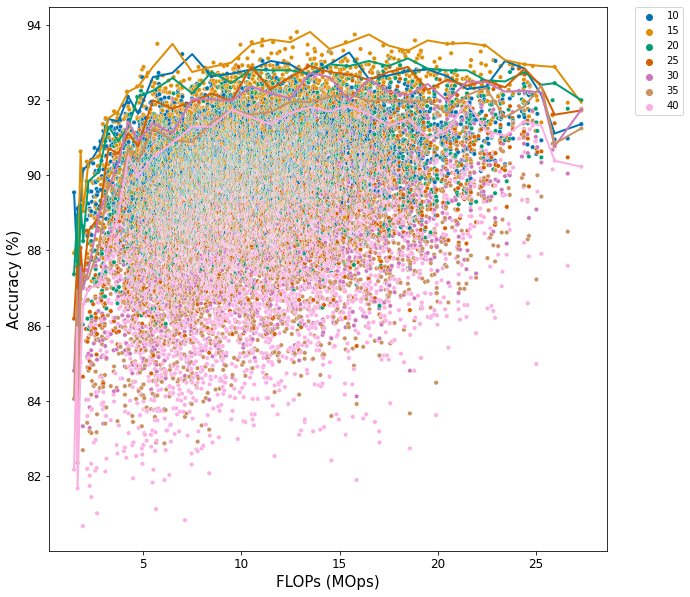

In [24]:
def plot_points_max_lines(df,x,y,hue,points_base, psize, palpha,lsize,laplhpa, base_func, x_label, y_label):
    tdf = df.copy()
    
    top_df = remove_worse(tdf, x, y, hue, points_base)
    sp = sns.scatterplot(x=x, y=y, hue=hue, data=top_df, s=psize, alpha=palpha, palette="colorblind")
    
    ttdf = df.copy()
    x_col = "rnd_" + x
    ttdf[x_col] = ttdf[x].apply(lambda val: base_func(num=val)) # build col with rounded val
    maxi = ttdf.groupby([x_col,hue]).max().reset_index() # For all same rounded x values, remove non max y
    
    sns.lineplot(x=x, y=y, hue=hue, data=maxi, legend=False, linewidth=lsize, alpha=lalpha, palette="colorblind")

    sp.set_ylabel(y_label,fontsize=15)
    sp.set_xlabel(x_label,fontsize=15)

    sp.tick_params(labelsize=12)
    # Put the legend out of the figure
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.show()
    

def base_func(num):
    if num < 2:
        base = .1
    elif num < 5:
        base = .5
    else:
        base = 1
    return base * round(num / base)

fig=plt.figure(figsize=(10,10))
plt.style.use('seaborn-dark-palette')

hue = "ft_extr_p0" # "params_id"
y = "top1"
x = "net_info.flops" #"net_info.MACs"

lsize = 2
lalpha = 1

psize = 20
palpha = 1
points_base = .001
x_label = "FLOPs (MOps)"
y_label = "Accuracy (%)"
df2 = df.copy()
#df2 = df2[df2["net_info.flops"] <=6]
# df2["net_info.MACs"] = df2["net_info.MACs"] * 2 / 1000000

# df2["net_info.params"] = df2["net_info.params"] * 2

# df2["net_info.MACs"] = df2["net_info.MACs"] * 2 / 1000

# df2 = df2[(df2["ft_extr_type"] == "log_mel_spectrogram") |(df2["ft_extr_type"] == "mel_spectrogram")]
# df2 = remove_worse(df2, x, y, hue, base=.1)


plot_points_max_lines(df2,x,y,hue,points_base, psize, palpha, lsize, lalpha, base_func, x_label, y_label)

/Users/nielsescarfail/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


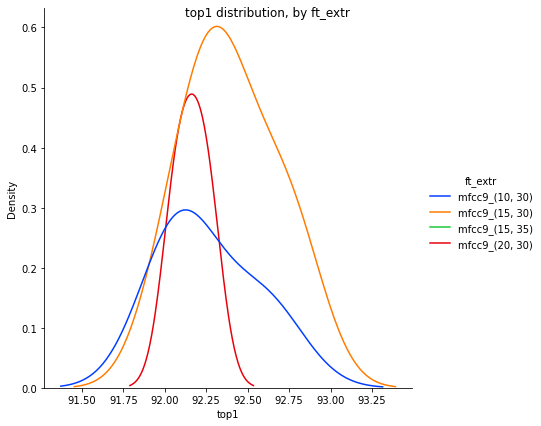

In [34]:
hue = "ft_extr"
col = None

# temp_df = df[df["top1"] > 93]
temp_df = df[df["net_info.flops"] < 5]
temp_df = temp_df[temp_df["top1"] > 92]
plot_distribution(y, hue, temp_df)

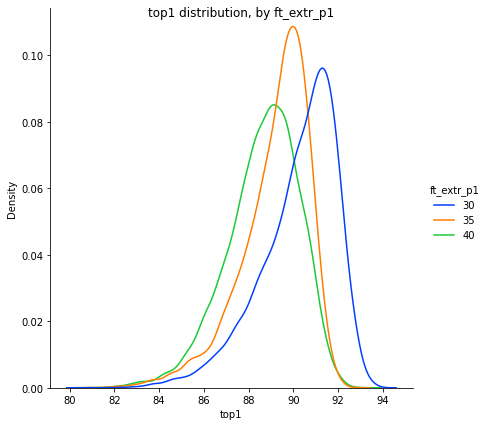

In [27]:
hue = "ft_extr_p1"
plot_distribution(y, hue, df)

In [82]:
### SUMMARY TABLE ACCURACY / FT_EXTR_P0 FOR SPECIFIC FT EXTR TYPE,
index = "ft_extr"

temp_df = df.copy()


sum_df = pd.DataFrame(columns = ["Feature extraction type",
                                 "Highest Accuracy","Average Accuracy", "Q1", "Q2", "Q3", "Q.95"], index = t1_df.index)

def q1(x):
    return x.quantile(0.25)

def q3(x):
    return x.quantile(0.75)

def q095(x):
    return x.quantile(0.95)

f = {'top1': ['max', 'mean', 'std', q1, 'median', q3, q095]}
sum_df = temp_df.groupby(index).agg(f)
sum_df = sum_df.rename(columns={"top1":"Accuracy summary depending on the "+ index,"max":"Highest Accuracy", "mean":"Average Accuracy", "std": "Std Dev", "q1":"Q1", "median":"Median", "q3":"Q3", "q095":"Q.95"})
sum_df = sum_df['Accuracy summary depending on the ft_extr']
sum_df.sort_values("Highest Accuracy", ascending=False)

,Highest Accuracy,Average Accuracy,Std Dev,Q1,Median,Q3,Q.95
ft_extr,,,,,,,
"mfcc9_(15, 30)",93.806715,91.815620,0.808490,91.356625,91.901089,92.377496,92.944647
"mfcc9_(10, 30)",93.262251,91.252850,0.676665,90.874547,91.288566,91.696915,92.286751
"mfcc9_(15, 40)",93.171507,90.231568,0.925718,89.632487,90.290381,90.885890,91.651543
"mfcc9_(20, 30)",93.103448,90.949524,1.061261,90.267695,91.129765,91.742287,92.377496
"mfcc9_(25, 30)",92.899274,90.329869,1.254792,89.587114,90.494555,91.220508,92.037206
"mfcc9_(30, 30)",92.717786,89.808317,1.455348,88.929220,89.972777,90.902904,91.764973
"mfcc9_(15, 35)",92.695100,90.442193,0.742536,89.995463,90.494555,90.948276,91.538113
"mfcc9_(35, 30)",92.377496,89.092843,1.584743,88.174910,89.269510,90.267695,91.288566
"mfcc9_(10, 40)",92.218693,89.885464,0.783321,89.337568,89.882033,90.426498,91.129764


In [85]:
### SUMMARY TABLE ACCURACY / FT_EXTR_P0 FOR SPECIFIC FT EXTR TYPE,
index = "ft_extr_p0"

temp_df = df.copy()


sum_df = pd.DataFrame(columns = ["Feature extraction type",
                                 "Highest Accuracy","Average Accuracy", "Q1", "Q2", "Q3", "Q.95"], index = t1_df.index)

def q1(x):
    return x.quantile(0.25)

def q3(x):
    return x.quantile(0.75)

def q095(x):
    return x.quantile(0.95)

f = {'top1': ['max', 'mean', 'std', q1, 'median', q3, q095]}
sum_df = temp_df.groupby(index).agg(f)
sum_df = sum_df.rename(columns={"top1":"Accuracy summary depending on the "+ index,"max":"Highest Accuracy", "mean":"Average Accuracy", "std": "Std Dev", "q1":"Q1", "median":"Median", "q3":"Q3", "q095":"Q.95"})
sum_df = sum_df["Accuracy summary depending on the " + index]
sum_df.sort_values("Highest Accuracy", ascending=False)

,Highest Accuracy,Average Accuracy,Std Dev,Q1,Median,Q3,Q.95
ft_extr_p0,,,,,,,
15,93.806715,90.829794,1.086490,90.086207,90.812160,91.583485,92.627042
10,93.262251,90.494428,0.900327,89.882033,90.494555,91.129764,91.946461
20,93.103448,89.994253,1.230985,89.178766,89.995463,90.834846,91.991833
25,92.899274,89.333806,1.389641,88.430127,89.382940,90.267695,91.628857
30,92.717786,88.852749,1.500736,87.885663,88.906534,89.882033,91.333939
35,92.377496,88.350703,1.573837,87.386570,88.475499,89.450998,90.789474
40,91.946461,87.604824,1.814242,86.496143,87.772232,88.906534,90.313067


In [86]:
### SUMMARY TABLE ACCURACY / FT_EXTR_P0 FOR SPECIFIC FT EXTR TYPE,
index = "ft_extr_p1"

temp_df = df.copy()


sum_df = pd.DataFrame(columns = ["Feature extraction type",
                                 "Highest Accuracy","Average Accuracy", "Q1", "Q2", "Q3", "Q.95"], index = t1_df.index)

def q1(x):
    return x.quantile(0.25)

def q3(x):
    return x.quantile(0.75)

def q095(x):
    return x.quantile(0.95)

f = {'top1': ['max', 'mean', 'std', q1, 'median', q3, q095]}
sum_df = temp_df.groupby(index).agg(f)
sum_df = sum_df.rename(columns={"top1":"Accuracy summary depending on the "+ index,"max":"Highest Accuracy", "mean":"Average Accuracy", "std": "Std Dev", "q1":"Q1", "median":"Median", "q3":"Q3", "q095":"Q.95"})
sum_df = sum_df["Accuracy summary depending on the " + index]
sum_df.sort_values("Highest Accuracy", ascending=False)

,Highest Accuracy,Average Accuracy,Std Dev,Q1,Median,Q3,Q.95
ft_extr_p1,,,,,,,
30,93.806715,90.239785,1.706652,89.292196,90.607986,91.492741,92.377496
40,93.171507,88.637686,1.623781,87.658802,88.815790,89.791289,90.970962
35,92.695100,89.177052,1.551104,88.384755,89.519057,90.267695,91.107078
